In [1]:
! pip install pyarrow

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pyarrow as pa
import pyarrow.parquet as pq
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import plot
from IPython.display import display
import ipywidgets as widgets

# Suppress warnings to enhance code readability
import warnings
warnings.filterwarnings('ignore')


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# ***Feature Table - Konya***

In [4]:
# import csv
# konya_features
konya = pd.read_parquet("/content/drive/Shareddrives/Projeto II/Created_Tables/konya_features.parquet")

###Explore the dataset


In [5]:
konya.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 532614 entries, 0 to 532613
Data columns (total 32 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   store_id               532614 non-null  object        
 1   product_id             532614 non-null  object        
 2   date                   532614 non-null  datetime64[ns]
 3   sales                  532614 non-null  float64       
 4   revenue                532614 non-null  float64       
 5   stock                  532614 non-null  float64       
 6   price                  531602 non-null  float64       
 7   promo_type_1           532614 non-null  category      
 8   promo_bin_1            75780 non-null   category      
 9   promo_type_2           532614 non-null  category      
 10  promo_bin_2            479 non-null     category      
 11  promo_discount_2       479 non-null     float64       
 12  promo_discount_type_2  479 non-null     cate

In [6]:
konya.shape

(532614, 32)

In [7]:
# Check data head
konya.head()

,store_id,product_id,date,sales,revenue,stock,price,promo_type_1,promo_bin_1,promo_type_2,...,storetype_id,store_size,city_id_old,country_id,city_code,weekday,season,week,holiday,month_name
0,S0030,P0015,2017-01-02,0.0,0.00,4.0,2.60,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
1,S0030,P0018,2017-01-02,1.0,1.81,5.0,1.95,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
2,S0030,P0035,2017-01-02,2.0,4.54,1.0,2.45,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
3,S0030,P0051,2017-01-02,0.0,0.00,27.0,0.70,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
4,S0030,P0055,2017-01-02,0.0,0.00,12.0,3.50,PR05,verylow,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan


In [8]:
konya.describe()

,date,sales,revenue,stock,price,promo_discount_2,product_length,product_depth,product_width,store_size,season,week
count,532614,532614.000000,532614.000000,532614.000000,531602.000000,479.000000,529456.000000,529481.000000,529481.000000,532614.000000,532614.000000,532614.000000
mean,2018-06-08 12:17:46.912999424,0.336482,1.403291,15.629129,16.338360,28.492693,6.520828,17.636908,12.352003,35.924358,2.390176,25.308542
min,2017-01-02 00:00:00,0.000000,0.000000,0.000000,0.010000,16.000000,0.000000,0.000000,0.000000,13.000000,1.000000,1.000000
25%,2017-10-12 00:00:00,0.000000,0.000000,4.000000,3.500000,20.000000,2.800000,11.100000,7.500000,31.000000,1.000000,13.000000
50%,2018-06-20 00:00:00,0.000000,0.000000,8.000000,8.650000,20.000000,5.000000,17.000000,10.000000,45.000000,2.000000,25.000000
75%,2019-02-11 00:00:00,0.000000,0.000000,16.000000,17.990000,50.000000,7.500000,22.500000,15.000000,45.000000,3.000000,37.000000
max,2019-09-30 00:00:00,301.000000,5879.350000,2700.000000,1599.000000,50.000000,100.000000,160.000000,100.000000,45.000000,4.000000,53.000000
std,NaN,1.803916,14.525375,29.790146,31.232437,13.180412,6.637565,11.421757,8.185511,10.573178,1.061095,14.331339


In [9]:
# evaluate the missing values
konya.isna().sum()

store_id                      0
product_id                    0
date                          0
sales                         0
revenue                       0
stock                         0
price                      1012
promo_type_1                  0
promo_bin_1              456834
promo_type_2                  0
promo_bin_2              532135
promo_discount_2         532135
promo_discount_type_2    532135
product_length             3158
product_depth              3133
product_width              3133
cluster_id                    0
hierarchy1_id                 0
hierarchy2_id                 0
hierarchy3_id                 0
hierarchy4_id                 0
hierarchy5_id                 0
storetype_id                  0
store_size                    0
city_id_old                   0
country_id                    0
city_code                     0
weekday                       0
season                        0
week                          0
holiday                       0
month_na

NOTE:
* promo_bin_2, promo_dicount_2, promo_discount_2, and promo_bin_1 contain mostly missing values ---- remove these variable
* price, product_length, product_depth, and product_width contain fewer missing values ---- replace missing values


In [10]:
konya[konya.isna().sum(axis = 1) > 1]

,store_id,product_id,date,sales,revenue,stock,price,promo_type_1,promo_bin_1,promo_type_2,...,storetype_id,store_size,city_id_old,country_id,city_code,weekday,season,week,holiday,month_name
0,S0030,P0015,2017-01-02,0.0,0.00,4.0,2.60,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
1,S0030,P0018,2017-01-02,1.0,1.81,5.0,1.95,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
2,S0030,P0035,2017-01-02,2.0,4.54,1.0,2.45,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
3,S0030,P0051,2017-01-02,0.0,0.00,27.0,0.70,PR14,NaN,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
4,S0030,P0055,2017-01-02,0.0,0.00,12.0,3.50,PR05,verylow,PR03,...,ST03,13,C006,Turkey,Konya,Mon,1,1,N,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
532609,S0142,P0733,2019-09-30,0.0,0.00,12.0,0.75,PR14,NaN,PR03,...,ST04,31,C006,Turkey,Konya,Mon,3,40,N,Sep
532610,S0142,P0741,2019-09-30,0.0,0.00,3.0,32.90,PR10,verylow,PR03,...,ST04,31,C006,Turkey,Konya,Mon,3,40,N,Sep
532611,S0142,P0742,2019-09-30,0.0,0.00,5.0,69.90,PR07,verylow,PR03,...,ST04,31,C006,Turkey,Konya,Mon,3,40,N,Sep
532612,S0142,P0747,2019-09-30,0.0,0.00,16.0,21.90,PR14,NaN,PR03,...,ST04,31,C006,Turkey,Konya,Mon,3,40,N,Sep


NOTE:
* 99.9% of the rows have missing values

###Visualization

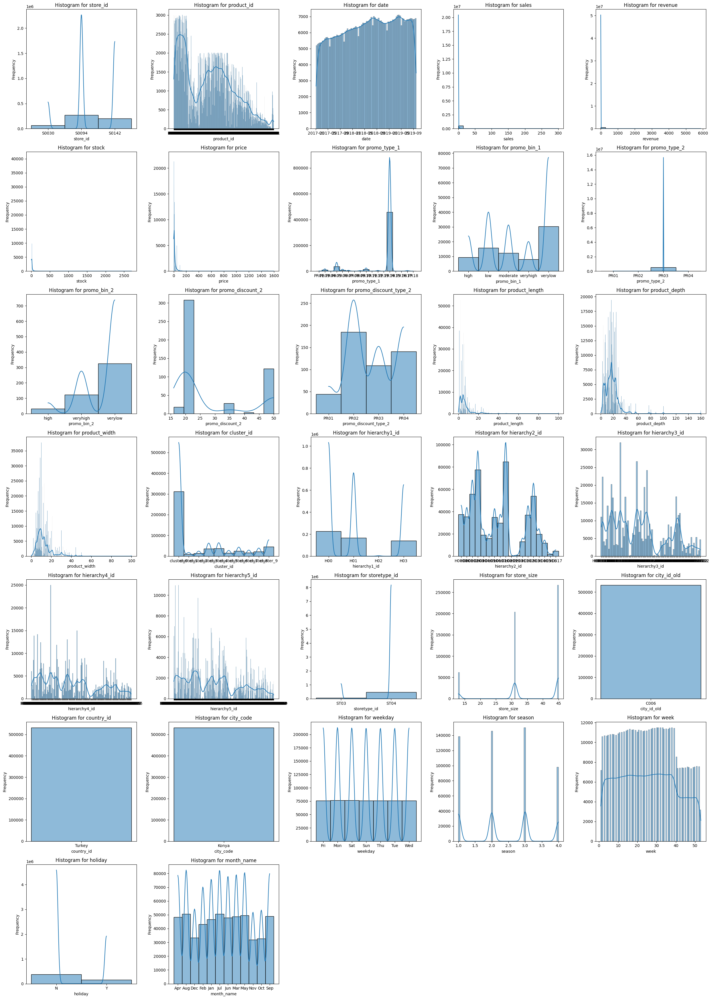

In [11]:
# Histograms
num_columns = 5  # Number of plots per row
num_rows = (len(konya.columns) + num_columns - 1) // num_columns  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

for i, column in enumerate(konya.columns):
    sns.histplot(konya[column], kde=True, ax=axs[i])
    axs[i].set_title(f'Histogram for {column}')
    axs[i].set_xlabel(column)
    axs[i].set_ylabel('Frequency')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

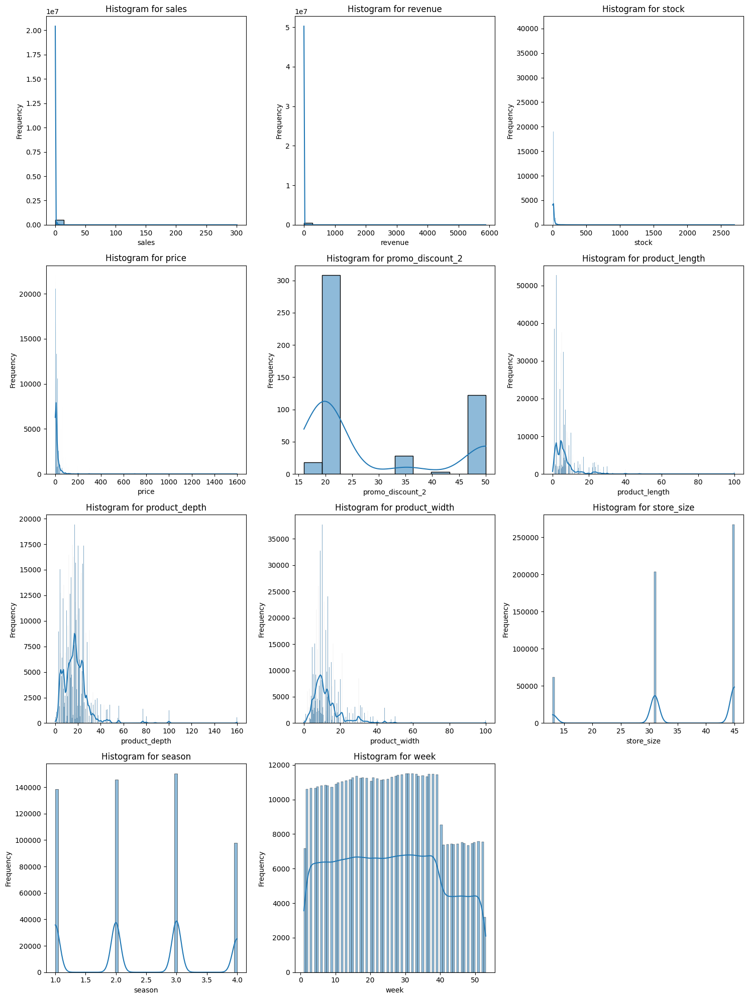

In [12]:
# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Calculate number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) + num_columns - 1) // num_columns

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot histograms for each numeric column
for i, column in enumerate(numeric_konya.columns):
    sns.histplot(numeric_konya[column], kde=True, ax=axs[i])
    axs[i].set_title(f'Histogram for {column}')
    axs[i].set_xlabel(column)
    axs[i].set_ylabel('Frequency')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

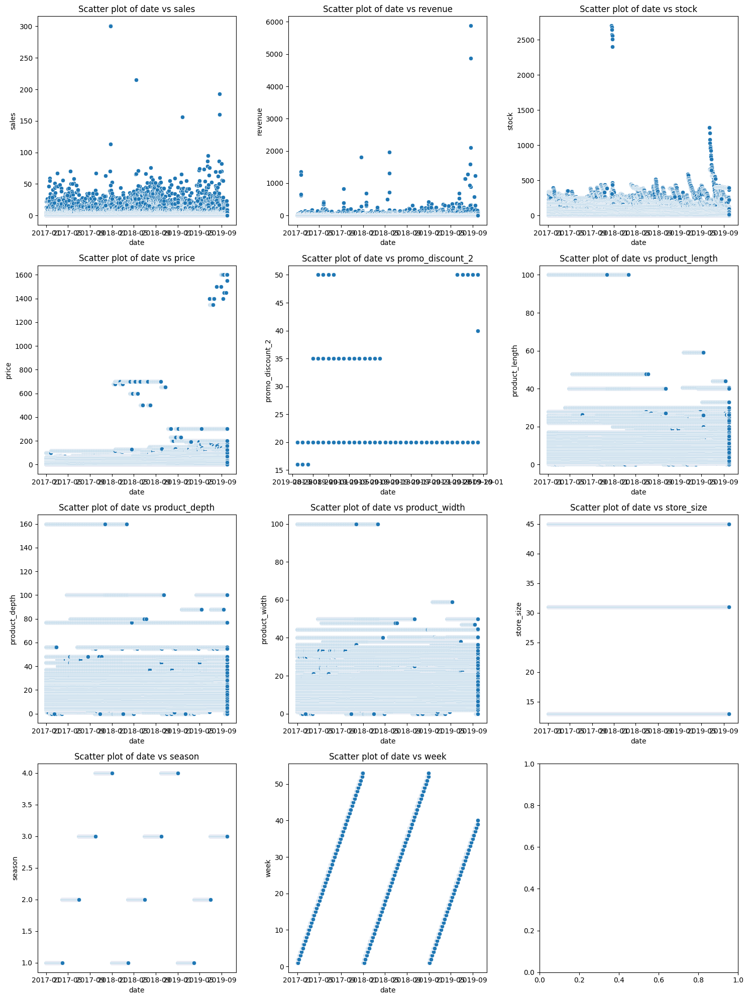

In [13]:
# Scatterplot for all varibles as a function of date
x_var = 'date'

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Add the 'date' column to the numeric DataFrame
numeric_konya = numeric_konya.join(konya[x_var])

# Calculate the number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) - 1) // num_columns + 1  # Exclude 'date' column from count

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot scatterplots for each numeric column
for i, column in enumerate(numeric_konya.columns):
    if column != x_var:  # Skip 'date' itself
        sns.scatterplot(x=x_var, y=column, data=numeric_konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

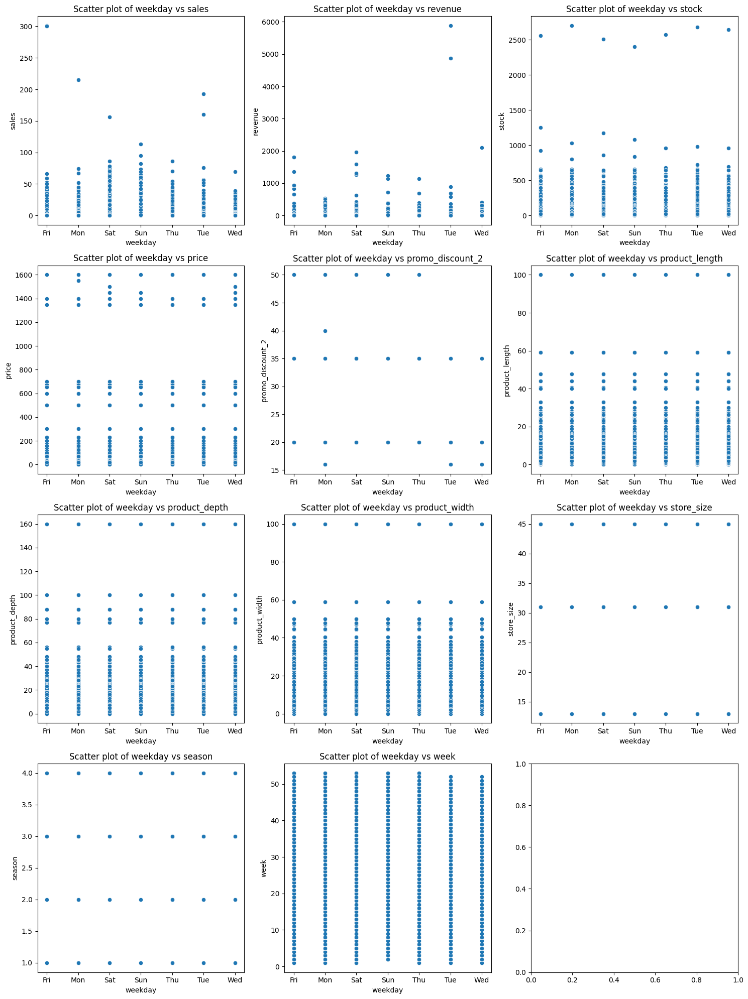

In [14]:
# Scatterplot for all varibles as a function of weekday
x_var = 'weekday'

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Add the 'date' column to the numeric DataFrame
numeric_konya = numeric_konya.join(konya[x_var])

# Calculate the number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) - 1) // num_columns + 1  # Exclude 'date' column from count

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot scatterplots for each numeric column
for i, column in enumerate(numeric_konya.columns):
    if column != x_var:  # Skip 'date' itself
        sns.scatterplot(x=x_var, y=column, data=numeric_konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

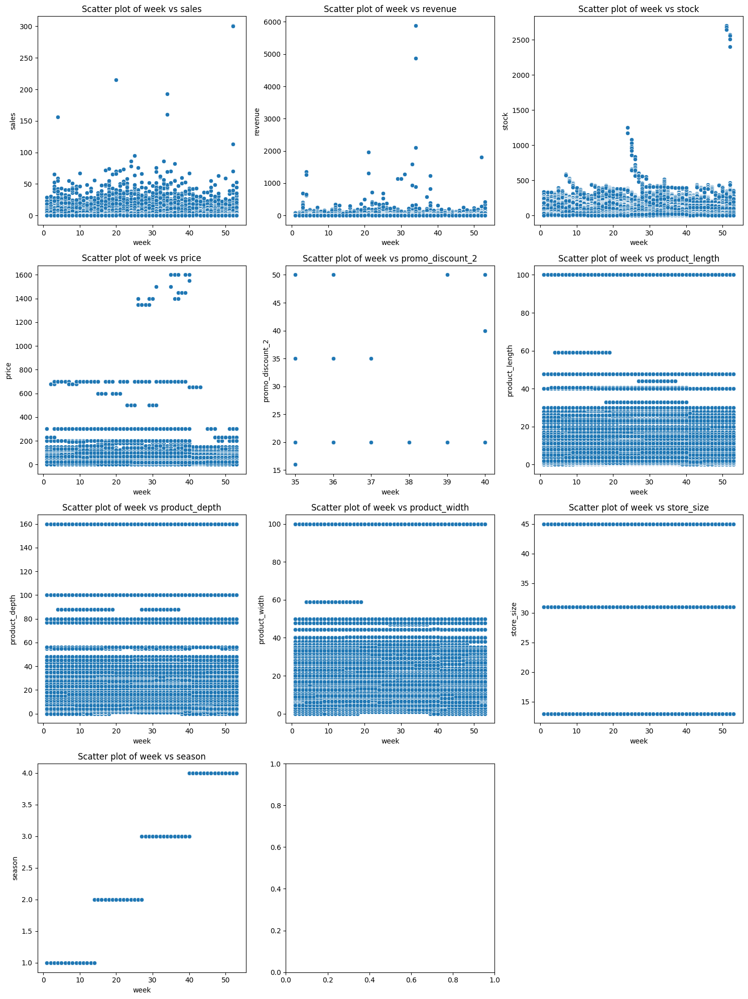

In [15]:
# Scatterplot for all varibles as a function of week
x_var = 'week'

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Add the 'week' column to the numeric DataFrame
numeric_konya[x_var] = konya[x_var]

# Calculate the number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) - 1) // num_columns + 1  # Exclude 'week' column from count

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot scatterplots for each numeric column
for i, column in enumerate(numeric_konya.columns):
    if column != x_var:  # Skip 'week' itself
        sns.scatterplot(x=x_var, y=column, data=numeric_konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

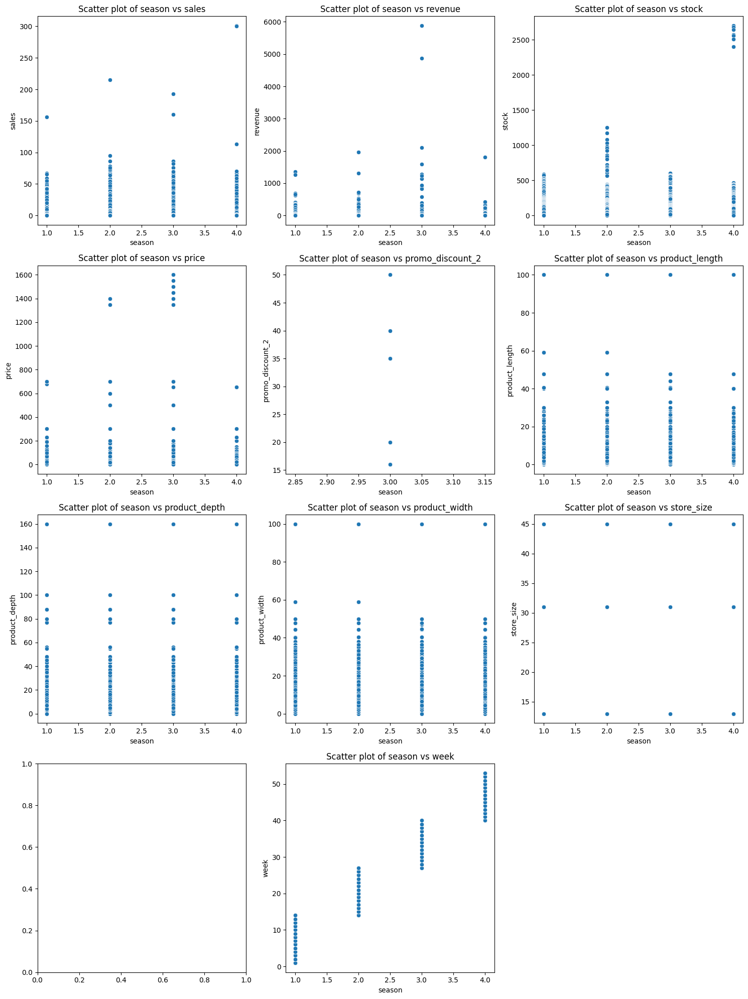

In [16]:
# Scatterplot for all varibles as a function of season
x_var = 'season'

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Add the 'week' column to the numeric DataFrame
numeric_konya[x_var] = konya[x_var]

# Calculate the number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) - 1) // num_columns + 1  # Exclude 'week' column from count

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot scatterplots for each numeric column
for i, column in enumerate(numeric_konya.columns):
    if column != x_var:  # Skip 'week' itself
        sns.scatterplot(x=x_var, y=column, data=numeric_konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

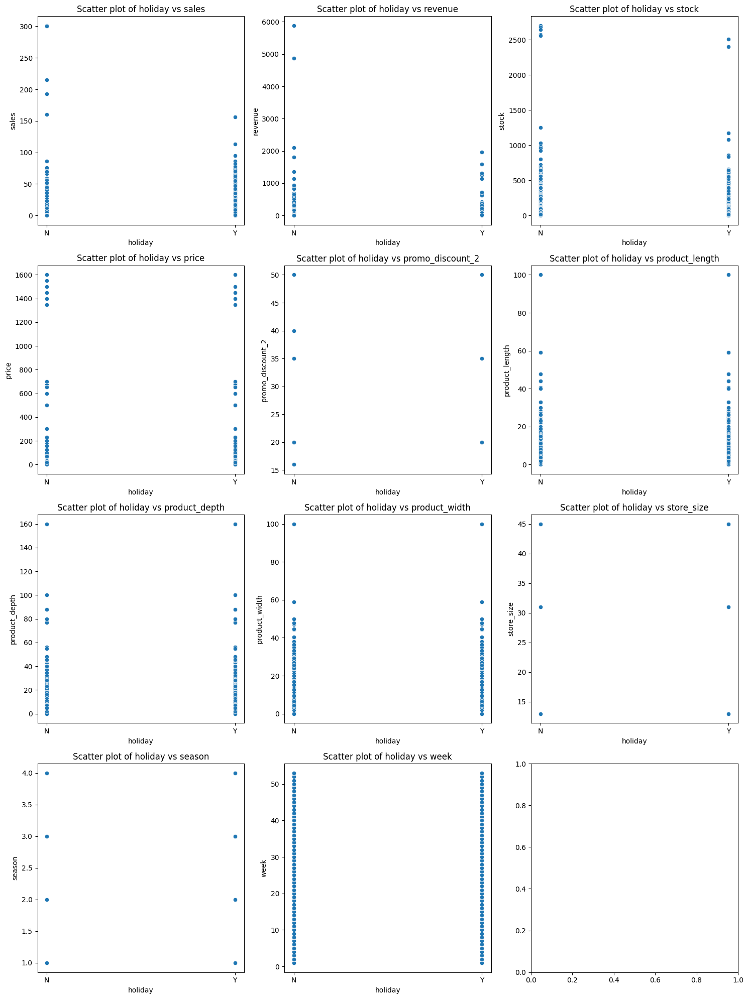

In [17]:
# Scatterplot for all varibles as a function of holiday
x_var = 'holiday'

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Add the 'date' column to the numeric DataFrame
numeric_konya = numeric_konya.join(konya[x_var])

# Calculate the number of rows needed
num_columns = 3  # Number of plots per row
num_rows = (len(numeric_konya.columns) - 1) // num_columns + 1  # Exclude 'date' column from count

# Create subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

# Plot scatterplots for each numeric column
for i, column in enumerate(numeric_konya.columns):
    if column != x_var:  # Skip 'date' itself
        sns.scatterplot(x=x_var, y=column, data=numeric_konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

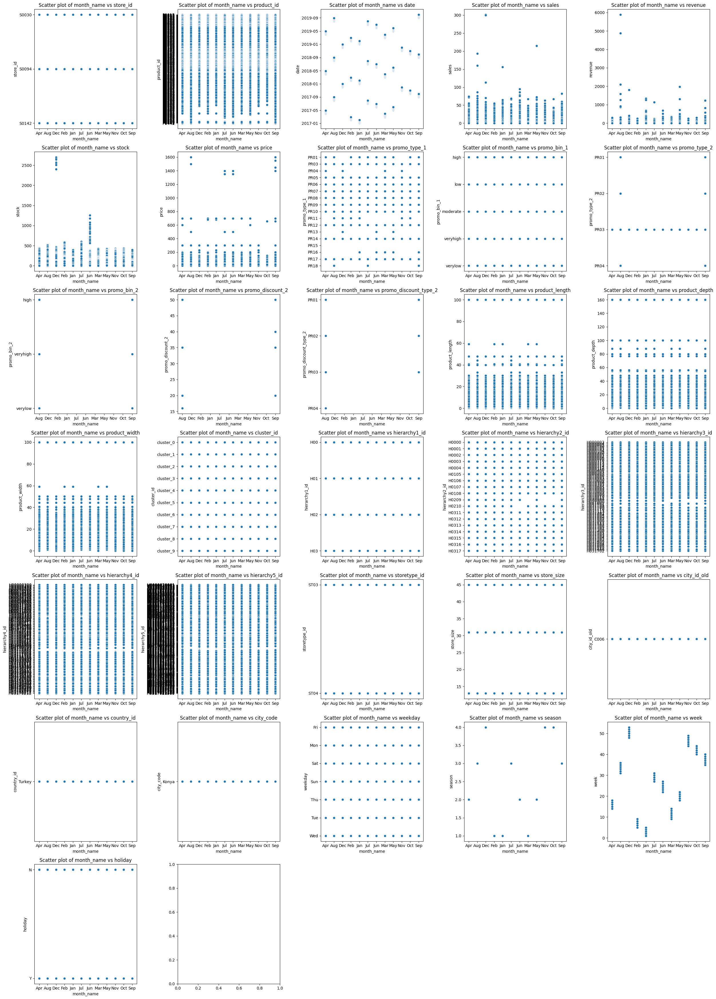

In [18]:
# Scatterplot for all varibles as a function of monthday
x_var = 'month_name'
num_columns = 5  # Number of plots per row
num_rows = (len(konya.columns) - 1) // num_columns + 1  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

for i, column in enumerate(konya.columns):
    if column != x_var:  # Skip 'Variable1' itself
        sns.scatterplot(x=x_var, y=column, data=konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

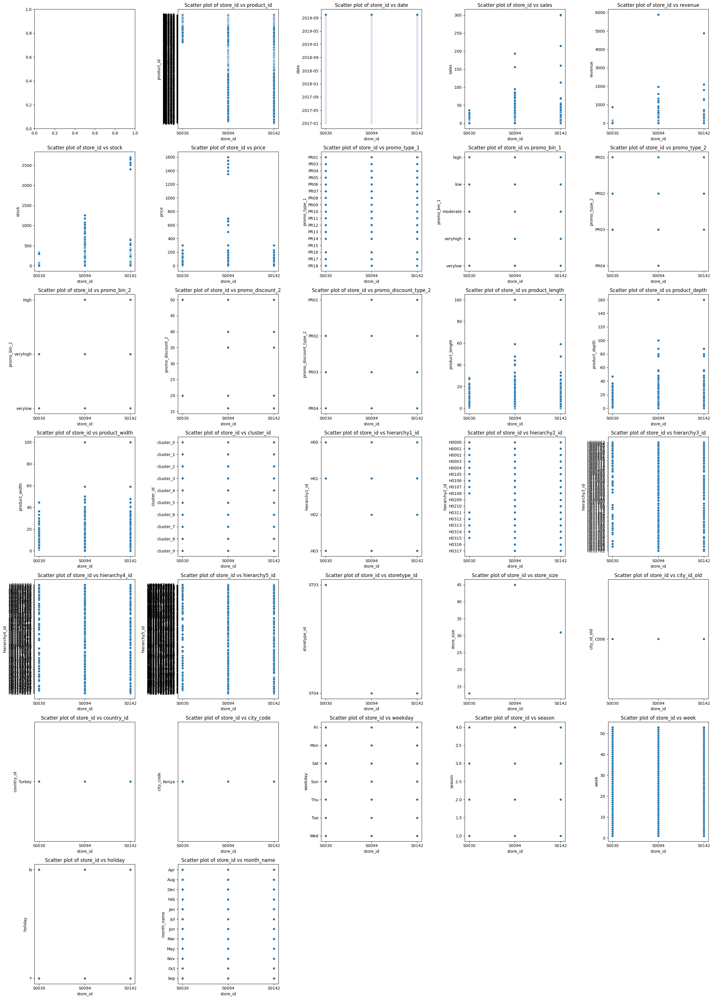

In [19]:
# Scatterplot for all varibles as a function of store_id
x_var = 'store_id'
num_columns = 5  # Number of plots per row
num_rows = (len(konya.columns) - 1) // num_columns + 1  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

for i, column in enumerate(konya.columns):
    if column != x_var:  # Skip 'Variable1' itself
        sns.scatterplot(x=x_var, y=column, data=konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

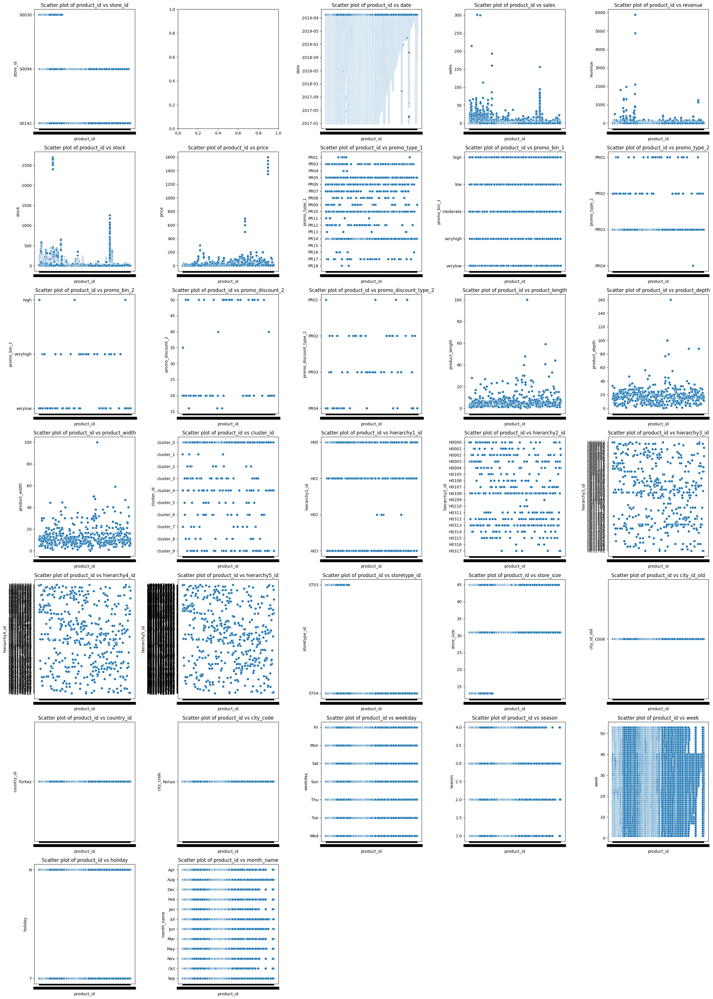

In [20]:
# Scatterplot for all varibles as a function of product_id
x_var = 'product_id'
num_columns = 5  # Number of plots per row
num_rows = (len(konya.columns) - 1) // num_columns + 1  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

for i, column in enumerate(konya.columns):
    if column != x_var:  # Skip 'Variable1' itself
        sns.scatterplot(x=x_var, y=column, data=konya, ax=axs[i])
        axs[i].set_title(f'Scatter plot of {x_var} vs {column}')
        axs[i].set_xlabel(x_var)
        axs[i].set_ylabel(column)

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

####Trends for cluster_id == cluster_0

In [21]:
# Filter the sales DataFrame to include only positive sales and cluster_0
filtered_H00 = konya[konya['sales'] > 0 & (konya['hierarchy1_id'] == 'H00')]

df_sales_H00 = filtered_H00.groupby(['product_id', 'week']).size().reset_index(name='count')

# Pivot the DataFrame
df_sales_H00_p = df_sales_H00.pivot(index='product_id', columns='week', values='count').reset_index()
df_sales_H00_p.columns.name = None


# Add a new column for the sum of each store across all weeks
df_sales_H00_p['total'] = df_sales_H00.sum(axis=1, numeric_only=True)


df_sales_H00_p

,product_id,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,total
0,P0001,NaN,1.0,5.0,3.0,1.0,1.0,2.0,1.0,2.0,...,NaN,2.0,1.0,2.0,1.0,NaN,3.0,1.0,NaN,3
1,P0005,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,8
2,P0006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,7
3,P0007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
4,P0008,1.0,1.0,1.0,1.0,2.0,NaN,2.0,NaN,NaN,...,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,2.0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,P0739,1.0,2.0,NaN,2.0,2.0,1.0,1.0,1.0,2.0,...,NaN,3.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0,30
462,P0741,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,34
463,P0742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32
464,P0747,3.0,10.0,6.0,5.0,6.0,7.0,8.0,8.0,14.0,...,1.0,6.0,4.0,5.0,5.0,3.0,5.0,3.0,5.0,36


In [22]:
# Filter the sales DataFrame to include only positive sales and hierarchy1_id 'H00'
filtered_H00 = konya[(konya['sales'] > 0) & (konya['hierarchy1_id'] == 'H00')]

# Group by product_id and week, then count the occurrences
df_sales_H00 = filtered_H00.groupby(['product_id', 'week']).size().reset_index(name='count')

# Pivot the DataFrame
df_sales_H00_p = df_sales_H00.pivot(index='product_id', columns='week', values='count').reset_index()
df_sales_H00_p.columns.name = None

# Add a new column for the sum of each product across all weeks
df_sales_H00_p['total'] = df_sales_H00_p.sum(axis=1, numeric_only=True)

# Remove rows that only have NaN values in the week columns
df_sales_H00_p = df_sales_H00_p.dropna(how='all', subset=df_sales_H00_p.columns[1:-1])

# Verify the contents to ensure that all products are from hierarchy1_id 'H00'
print(df_sales_H00_p.head())

  product_id    1     2     3     4     5     6     7     8     9  ...    45  \
0      P0008  1.0   1.0   1.0   1.0   2.0   NaN   2.0   NaN   NaN  ...   NaN   
1      P0009  NaN   NaN   NaN   NaN   NaN   NaN   NaN   1.0   2.0  ...   NaN   
2      P0015  3.0   4.0   9.0   7.0   5.0   9.0   9.0   6.0   8.0  ...   7.0   
3      P0017  9.0  18.0  24.0  20.0  18.0  19.0  17.0  19.0  16.0  ...  11.0   
4      P0018  4.0   3.0   3.0   5.0   6.0   5.0   6.0   2.0   1.0  ...   1.0   

     46    47    48    49    50    51    52   53   total  
0   NaN   1.0   1.0   1.0   1.0   1.0   1.0  2.0    50.0  
1   NaN   NaN   NaN   NaN   NaN   NaN   NaN  NaN    32.0  
2   5.0   4.0   2.0   7.0   5.0   3.0   4.0  4.0   357.0  
3  20.0  13.0  15.0  11.0  14.0  12.0  16.0  8.0  1001.0  
4   NaN   1.0   2.0   3.0   3.0   5.0   2.0  1.0   224.0  

[5 rows x 55 columns]


In [23]:
# Filter the sales DataFrame to include only positive sales and cluster_0
filtered_cluster_0 = konya[konya['sales'] > 0 & (konya['cluster_id'] == 'cluster_0')]

df_sales_cluster_0 = filtered_cluster_0.groupby(['product_id', 'week']).size().reset_index(name='count')

# Pivot the DataFrame
df_sales_cluster_0_p = df_sales_cluster_0.pivot(index='product_id', columns='week', values='count').reset_index()
df_sales_cluster_0_p.columns.name = None


# Add a new column for the sum of each store across all weeks
df_sales_cluster_0_p['total'] = df_sales_cluster_0.sum(axis=1, numeric_only=True)

# Remove rows that only have NaN values
df_sales_cluster_0_p = df_sales_cluster_0_p.dropna(how='all', subset=list(range(1, 54)))

df_sales_cluster_0_p

,product_id,1,2,3,4,5,6,7,8,9,...,45,46,47,48,49,50,51,52,53,total
0,P0001,NaN,1.0,5.0,3.0,1.0,1.0,2.0,1.0,2.0,...,NaN,2.0,1.0,2.0,1.0,NaN,3.0,1.0,NaN,3
1,P0005,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,8
2,P0006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,7
3,P0007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6
4,P0008,1.0,1.0,1.0,1.0,2.0,NaN,2.0,NaN,NaN,...,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,2.0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,P0739,1.0,2.0,NaN,2.0,2.0,1.0,1.0,1.0,2.0,...,NaN,3.0,4.0,4.0,4.0,2.0,2.0,4.0,1.0,30
462,P0741,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,34
463,P0742,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32
464,P0747,3.0,10.0,6.0,5.0,6.0,7.0,8.0,8.0,14.0,...,1.0,6.0,4.0,5.0,5.0,3.0,5.0,3.0,5.0,36


In [24]:
# Melt the DataFrame to long format for use with plotly
df_long_cluster_0 = pd.melt(df_sales_cluster_0_p, id_vars=['product_id'], value_vars=list(range(1, 54)),
                  var_name='week', value_name='count').dropna()
# Create the plot using plotly.express

fig = px.bar(df_long_cluster_0, x='product_id', y='count', color='week',
             title='Sales Count for cluster_0 by week',
             labels={'product_id': 'Product ID', 'count': 'Sales Count'})

# Update layout for better readability
fig.update_layout(xaxis=dict(tickangle=45))

# Display the plot
fig.show()

###Correlations

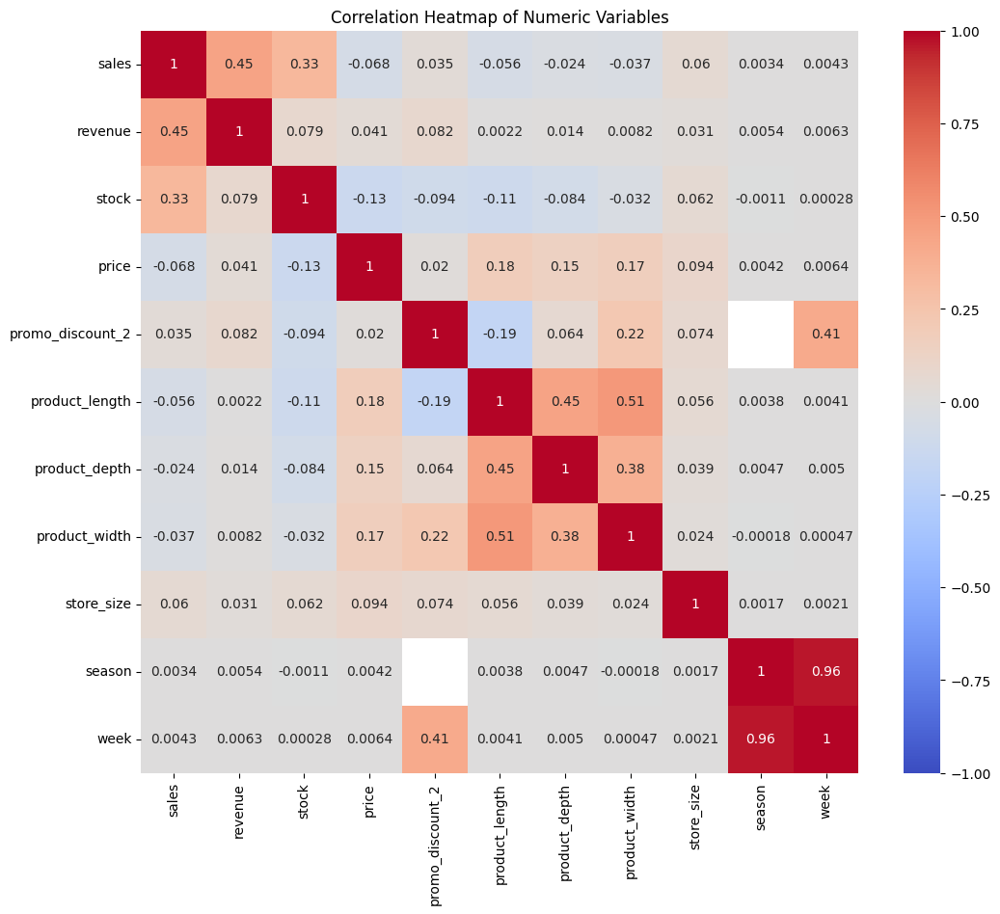

In [25]:
# Find correlations
numeric_konya = konya.select_dtypes(include='number')  # Select only numeric columns

# Create a heatmap of the correlation matrix for numeric variables
plt.figure(figsize=(12, 10))
sns.heatmap(numeric_konya.corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Numeric Variables')
plt.show()

Correlations:<br><br>
-Strong: season-week <br>
-Moderate: sales-revenue; promo_discount_2-week; product_lenght-product_depth; product_lenght-product_width

###Outliers detection

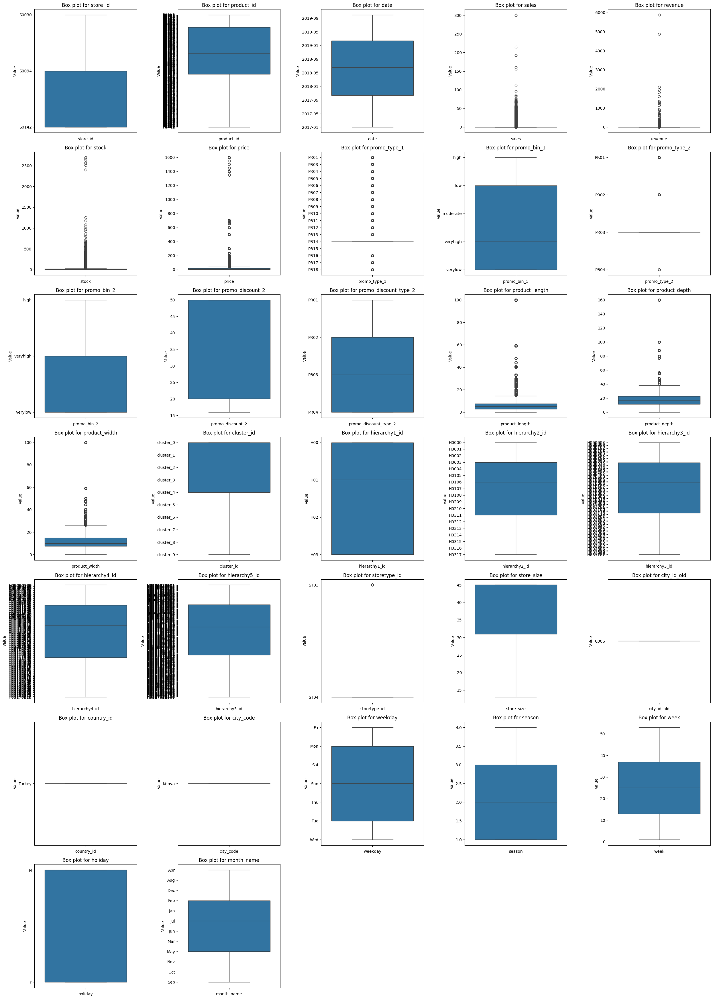

In [26]:
# Detect outliers
num_columns = 5  # Number of plots per row
num_rows = (len(konya.columns) + num_columns - 1) // num_columns  # Calculate number of rows needed

fig, axs = plt.subplots(num_rows, num_columns, figsize=(num_columns * 5, num_rows * 5))
axs = axs.flatten()  # Flatten the 2D array of axes to 1D for easier iteration

for i, column in enumerate(konya.columns):
    sns.boxplot(y=konya[column], ax=axs[i])
    axs[i].set_title(f'Box plot for {column}')
    axs[i].set_xlabel(column)
    axs[i].set_ylabel('Value')

# Remove any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

Outliers:<br>

-Unnamed:0<br>
-Sales<br>
-Revenue<br>
-Stock <br>
-Price<br>
-Product_lenght<br>
-Product_depth<br>
-Product_width<br>


In [27]:
# Function to count outliers and calculate percentage based on IQR method
def count_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = series[(series < lower_bound) | (series > upper_bound)]
    num_outliers = outliers.count()
    percentage_outliers = (num_outliers / series.count()) * 100
    return num_outliers, percentage_outliers

# Select only numeric columns
numeric_konya = konya.select_dtypes(include='number')

# Iterate over each numeric column and count outliers
outlier_counts = {}
for column in numeric_konya.columns:
    num_outliers, percentage_outliers = count_outliers(numeric_konya[column])
    outlier_counts[column] = (num_outliers, percentage_outliers)

# Print the number and percentage of outliers for each numeric variable
for column, (num_outliers, percentage_outliers) in outlier_counts.items():
    print(f'{column}: {num_outliers} outliers ({percentage_outliers:.2f}% of total observations)')

sales: 71381 outliers (13.40% of total observations)
revenue: 71324 outliers (13.39% of total observations)
stock: 45930 outliers (8.62% of total observations)
price: 49698 outliers (9.35% of total observations)
promo_discount_2: 0 outliers (0.00% of total observations)
product_length: 42466 outliers (8.02% of total observations)
product_depth: 15028 outliers (2.84% of total observations)
product_width: 37232 outliers (7.03% of total observations)
store_size: 0 outliers (0.00% of total observations)
season: 0 outliers (0.00% of total observations)
week: 0 outliers (0.00% of total observations)


#**Sales Analysis**

In [28]:
# Extract year and month
konya['Year'] = konya['date'].dt.year
konya['Month'] = konya['date'].dt.strftime('%b')


In [29]:
# Separate DataFrames for each year
df_2017 = konya[konya['Year'] == 2017]
df_2018 = konya[konya['Year'] == 2018]
df_2019 = konya[konya['Year'] == 2019]


In [30]:
# Group by month for each year
grouped_2017 = df_2017.groupby(df_2017['date'].dt.month)['sales'].sum()
grouped_2018 = df_2018.groupby(df_2018['date'].dt.month)['sales'].sum()
grouped_2019 = df_2019.groupby(df_2019['date'].dt.month)['sales'].sum()

#### Plotting the data

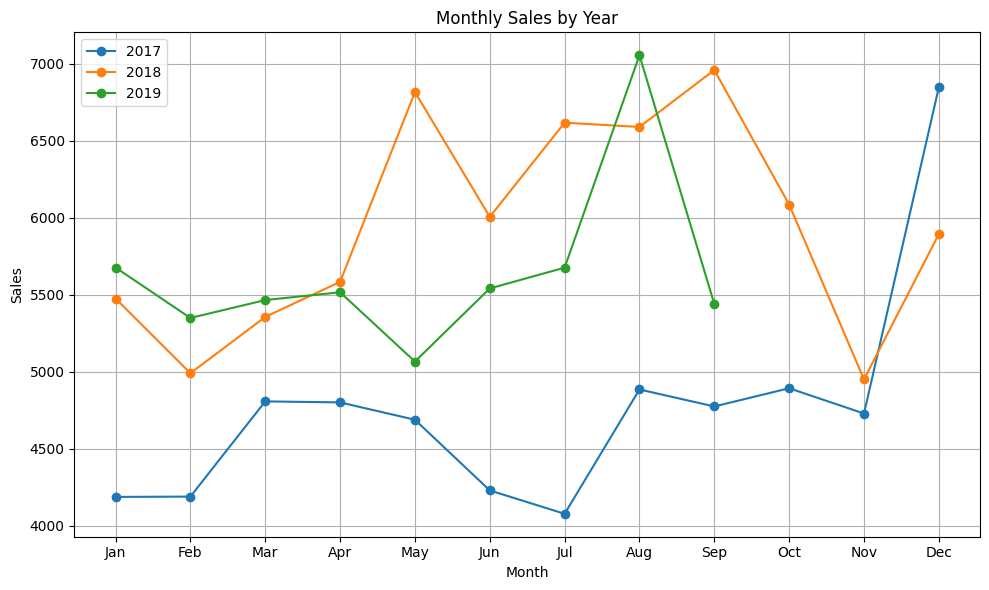

In [31]:
# Plotting
plt.figure(figsize=(10, 6))

plt.plot(grouped_2017.index, grouped_2017.values, marker='o', linestyle='-', label='2017')
plt.plot(grouped_2018.index, grouped_2018.values, marker='o', linestyle='-', label='2018')
plt.plot(grouped_2019.index, grouped_2019.values, marker='o', linestyle='-', label='2019')

plt.title('Monthly Sales by Year')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Avg Sales By Day, Week, Month and Day Of Week


In [32]:
# set date as index
df = konya.copy()
df.set_index('date', inplace = True)
# Ensure the DataFrame is sorted by date
df.sort_index(inplace=True)
# confirm index
df.head()

,store_id,product_id,sales,revenue,stock,price,promo_type_1,promo_bin_1,promo_type_2,promo_bin_2,...,city_id_old,country_id,city_code,weekday,season,week,holiday,month_name,Year,Month
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02,S0030,P0015,0.0,0.00,4.0,2.60,PR14,NaN,PR03,NaN,...,C006,Turkey,Konya,Mon,1,1,N,Jan,2017,Jan
2017-01-02,S0142,P0114,1.0,0.42,24.0,0.45,PR14,NaN,PR03,NaN,...,C006,Turkey,Konya,Mon,1,1,N,Jan,2017,Jan
2017-01-02,S0142,P0110,0.0,0.00,2.0,2.95,PR14,NaN,PR03,NaN,...,C006,Turkey,Konya,Mon,1,1,N,Jan,2017,Jan
2017-01-02,S0142,P0103,0.0,0.00,46.0,2.65,PR14,NaN,PR03,NaN,...,C006,Turkey,Konya,Mon,1,1,N,Jan,2017,Jan
2017-01-02,S0142,P0102,0.0,0.00,8.0,99.90,PR14,NaN,PR03,NaN,...,C006,Turkey,Konya,Mon,1,1,N,Jan,2017,Jan


In [33]:
# return only sales >0
df = df[df['sales'] > 0]


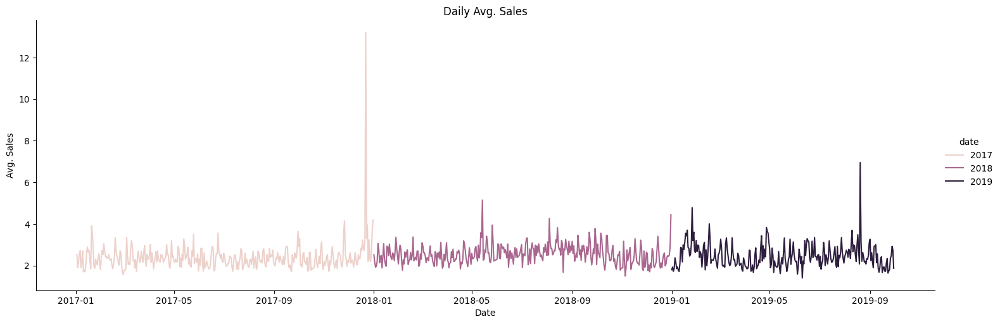

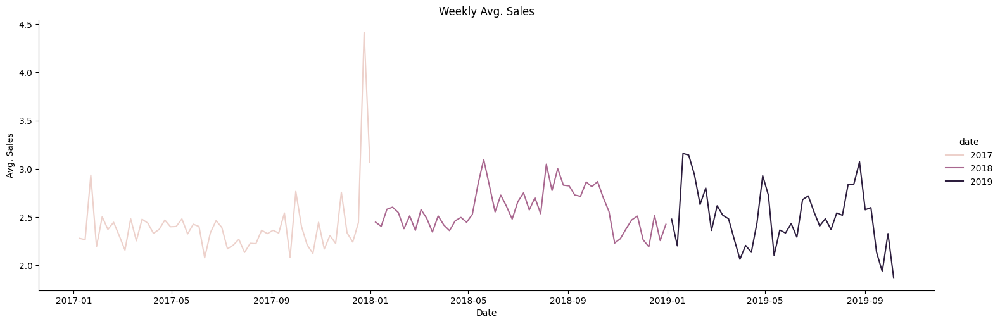

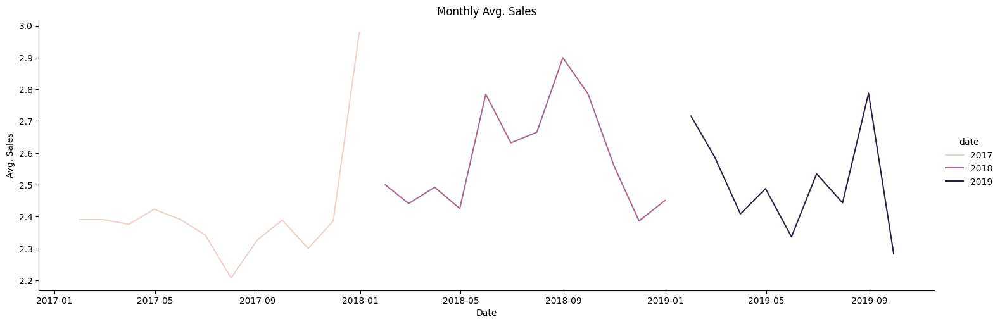

In [34]:
# plot average  sales

daily_sales=df.resample('D').sales.mean().to_frame()  # Resample sales by day
weekly_sales=df.resample('W').sales.mean().to_frame()  # Resample sales by week
monthly_sales=df.resample('M').sales.mean().to_frame()  # Resample sales by month

df_list=[daily_sales,weekly_sales,monthly_sales]
titles=['Daily Avg. Sales','Weekly Avg. Sales','Monthly Avg. Sales']

for i,j in zip(df_list,titles):

    sns.relplot(x=i.index,y=i.sales,kind='line',aspect=3,hue=i.index.year)
    plt.xlabel('Date')
    plt.ylabel('Avg. Sales')
    plt.title(j)

*   There was a high increase in sales at the end of 2017
*   increse in sales for months: 5-6 and 9






### Sales per store

In [35]:
# Filter the sales DataFrame to include only positive sales
filtered_sales = df[df['sales'] > 0]

df_sales_store = filtered_sales.groupby(['store_id', 'Year']).size().reset_index(name='count')

# Pivot the DataFrame
df_sales_store_p = df_sales_store.pivot(index='store_id', columns='Year', values='count').reset_index()
df_sales_store_p.columns.name = None


# Add a new column for the sum of each store across all years
df_sales_store_p['total'] = df_sales_store.sum(axis=1, numeric_only=True)
df_sales_store_p

,store_id,2017,2018,2019,total
0,S0030,2934,2693,2462,4951
1,S0094,13459,16665,12403,4711
2,S0142,7231,8167,5367,4481


In [36]:
# Melt the DataFrame to long format for use with plotly
df_long = pd.melt(df_sales_store_p, id_vars=['store_id'], value_vars=[2017, 2018, 2019],
                  var_name='Year', value_name='count').dropna()
# Create the plot using plotly.express

fig = px.bar(df_long, x='store_id', y='count', color='Year',
             title='Sales Count per Store by Year',
             labels={'store_id': 'Store ID', 'count': 'Sales Count'})

# Update layout for better readability
fig.update_layout(xaxis=dict(tickangle=45))

# Display the plot
fig.show()



*   store S0094 has the higher sales for both years
*   all 3 stores were oppened since 2017 and have sales registered



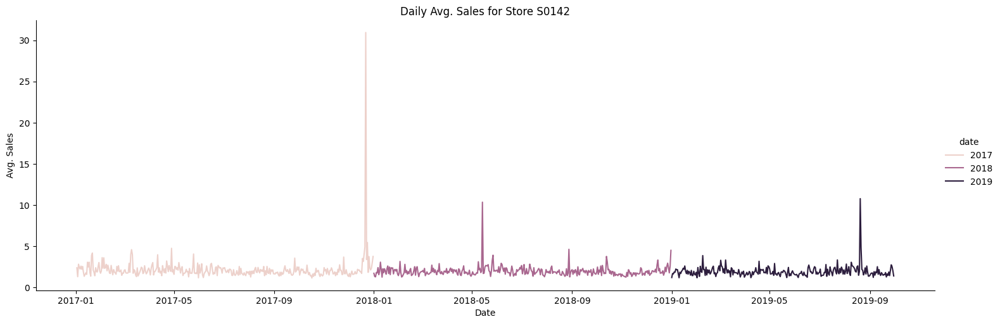

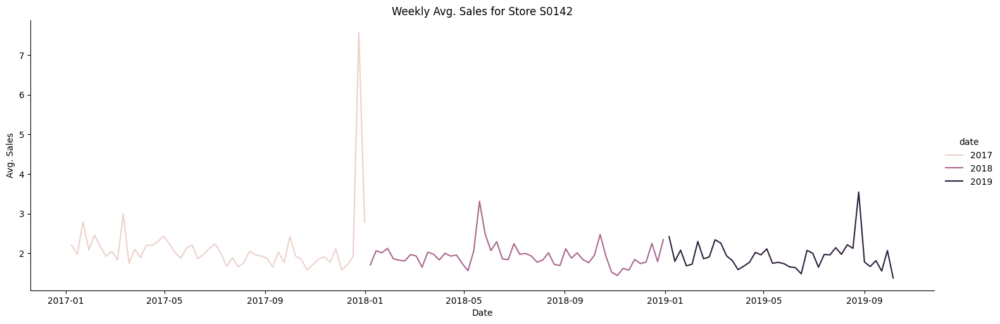

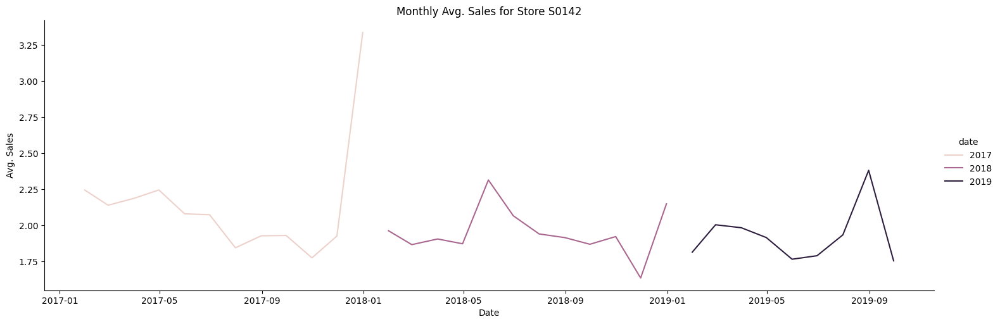

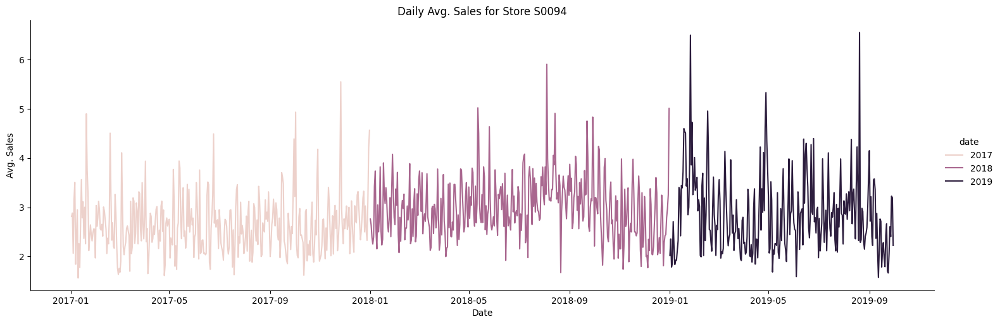

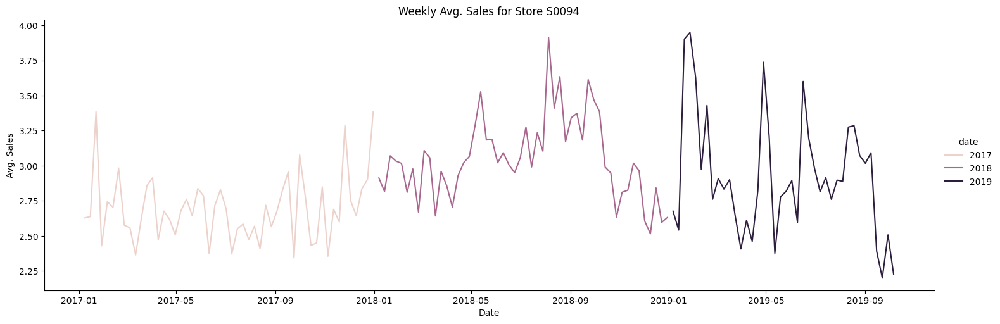

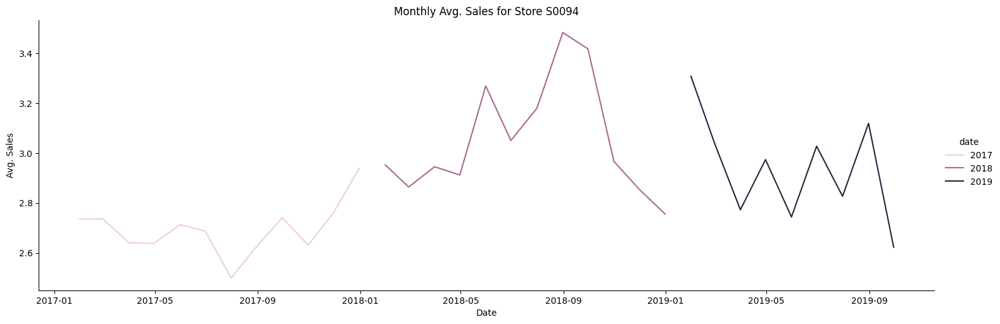

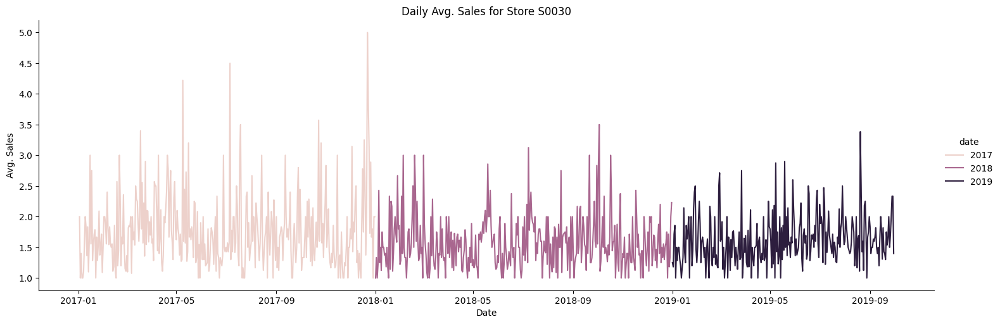

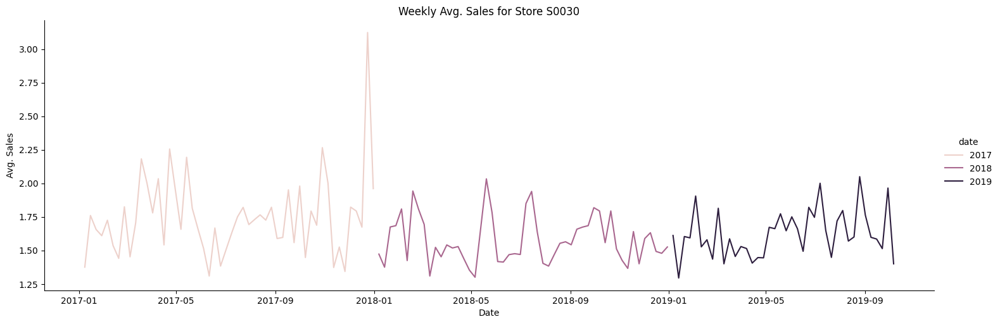

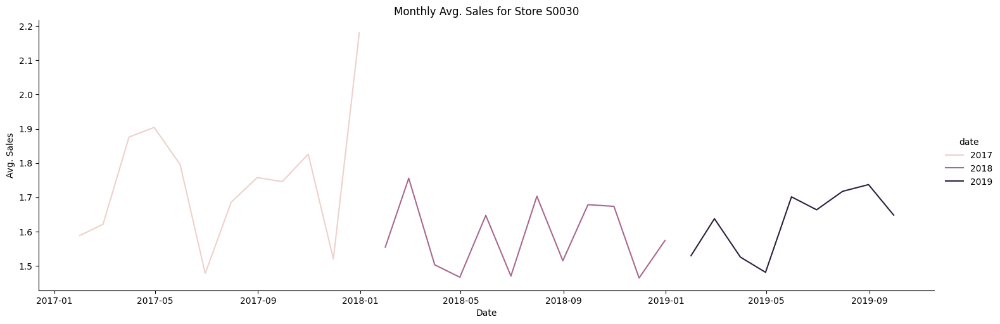

In [37]:
# Assuming df is your DataFrame containing sales data with a 'store_id' column
unique_stores = filtered_sales['store_id'].unique()

# Iterate through each unique store_id
for store in unique_stores:
    store_df = filtered_sales[filtered_sales['store_id'] == store]

    # Resample sales data for the current store
    daily_sales = store_df.resample('D').sales.mean().to_frame()
    weekly_sales = store_df.resample('W').sales.mean().to_frame()
    monthly_sales = store_df.resample('M').sales.mean().to_frame()

    df_list = [daily_sales, weekly_sales, monthly_sales]
    titles = [f'Daily Avg. Sales for Store {store}', f'Weekly Avg. Sales for Store {store}', f'Monthly Avg. Sales for Store {store}']

    # Plot the average sales for each resampled period
    for i, j in zip(df_list, titles):
        sns.relplot(x=i.index, y=i.sales, kind='line', aspect=3, hue=i.index.year)
        plt.xlabel('Date')
        plt.ylabel('Avg. Sales')
        plt.title(j)
        plt.show()



*   The data seems to be non stationary for the 3 stores
*   No aparent sasonality for the 3 stores





## Revenue per store

In [ ]:
# Group by store_id and Year, then sum the revenue
df_revenue_store = filtered_sales.groupby(['store_id', 'Year'])['revenue'].sum().reset_index()

# Pivot the DataFrame
df_revenue_store_p = df_revenue_store.pivot(index='store_id', columns='Year', values='revenue').reset_index()
df_revenue_store_p.columns.name = None

# Add a new column for the sum of revenue for each store across all years
df_revenue_store_p['total_rev'] = df_revenue_store_p.sum(axis=1, numeric_only=True)
df_revenue_store_p

,store_id,2017,2018,2019,total_rev
0,S0030,11714.44,14265.04,19491.58,45471.06
1,S0094,115897.29,186188.63,201335.03,503420.95
2,S0142,55382.22,72840.57,70297.45,198520.24


In [ ]:
# vizualization of results

# Melt the DataFrame to have a long format for easier plotting
df_melted = df_revenue_store_p.melt(id_vars=['store_id', 'total_rev'], var_name='Year', value_name='revenue')

# Create a figure
fig = go.Figure()

# Add bar traces for each year
years = df_melted['Year'].unique()
for year in years:
    df_year = df_melted[df_melted['Year'] == year]
    fig.add_trace(go.Bar(x=df_year['store_id'], y=df_year['revenue'], name=f'{year}'))

# Add a line trace for total revenue per store
fig.add_trace(go.Scatter(
    x=df_revenue_store_p['store_id'],
    y=df_revenue_store_p['total_rev'],
    mode='lines+markers',
    name='Total Revenue',
    line=dict(color='black', dash='dash')
))

# Update layout
fig.update_layout(
    title='Revenue per Store per Year',
    xaxis_title='Store ID',
    yaxis_title='Revenue',
    barmode='group'
)

# Show the plot
fig.show()



*   S0094 store has the higher revenue, across the years.



### Sales per product

In [ ]:
# Filter the sales DataFrame to include only positive sales
filtered_sales = df[df['sales'] > 0]

df_sales_product = filtered_sales.groupby(['product_id', 'Year']).size().reset_index(name='count')

# Pivot the DataFrame
df_sales_product = df_sales_product.pivot(index='product_id', columns='Year', values='count').reset_index()
df_sales_product.columns.name = None


# Add a new column for the sum of each store across all years
df_sales_product['total'] = df_sales_product.sum(axis=1, numeric_only=True)
df_sales_product

,product_id,2017,2018,2019,total
0,P0001,17.0,21.0,NaN,38.0
1,P0005,NaN,8.0,3.0,11.0
2,P0006,NaN,6.0,1.0,7.0
3,P0007,NaN,5.0,6.0,11.0
4,P0008,NaN,22.0,28.0,50.0
...,...,...,...,...,...
461,P0739,NaN,24.0,39.0,63.0
462,P0741,NaN,6.0,6.0,12.0
463,P0742,NaN,NaN,11.0,11.0
464,P0747,147.0,123.0,73.0,343.0


In [ ]:
# Melt the DataFrame to long format for use with plotly
df_product_long = pd.melt(df_sales_product, id_vars=['product_id'], value_vars=[2017, 2018, 2019],
                  var_name='Year', value_name='count').dropna()
# Create the plot using plotly.express

fig = px.bar(df_product_long, x='product_id', y='count', color='Year',
             title='Sales Count per Product by Year',
             labels={'store_id': 'Store ID', 'count': 'Sales Count'})

# Update layout for better readability
fig.update_layout(xaxis=dict(tickangle=45))

# Display the plot
fig.show()

*   Some products only have sales from 2018. Probably new products inserted in 2018.
*   Some products started selling only in 2019 (new products).
*   Products selling from 2017 registered more sales in 2019, compared with new products.



###Top selling products per store

In [ ]:
#group by city_code and product_id and count sales
m_pro=df.groupby(['store_id','product_id'])['sales'].count()
o=pd.DataFrame(m_pro.sort_values(ascending=False))

# Sort the data by city and sales count
o = o.sort_values(by=['store_id', 'sales'], ascending=[True, False])

# Get top 5 products per city
o_top5 = o.groupby('store_id').head(5)
o_top5

sales
store_id product_id       
S0030    P0569         559
         P0436         453
         P0103         383
         P0438         369
         P0364         369
S0094    P0103         989
         P0364         963
         P0131         909
         P0125         801
         P0569         773
S0142    P0103         760
         P0131         650
         P0569         586
         P0364         529
         P0436         456

###Sales evolution for top selling products

####S0030

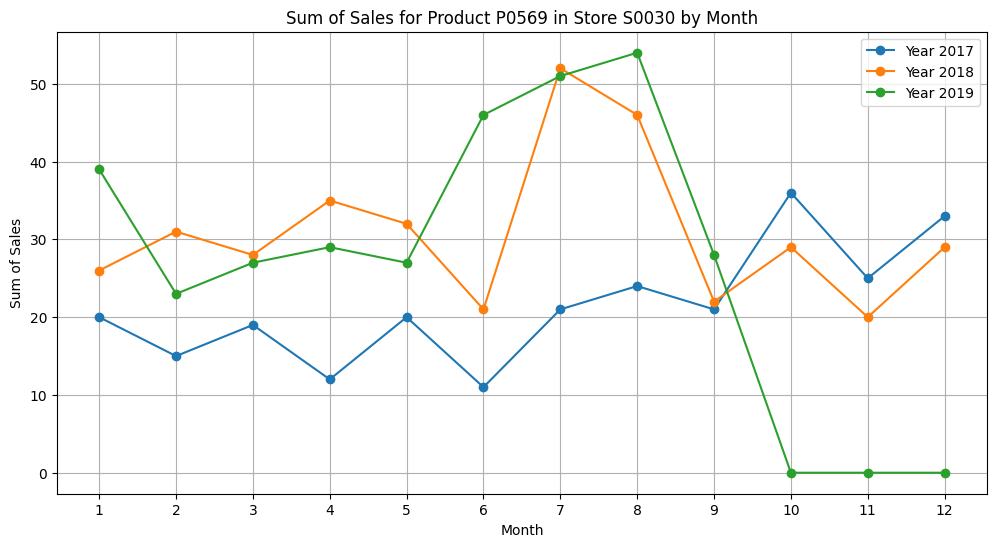

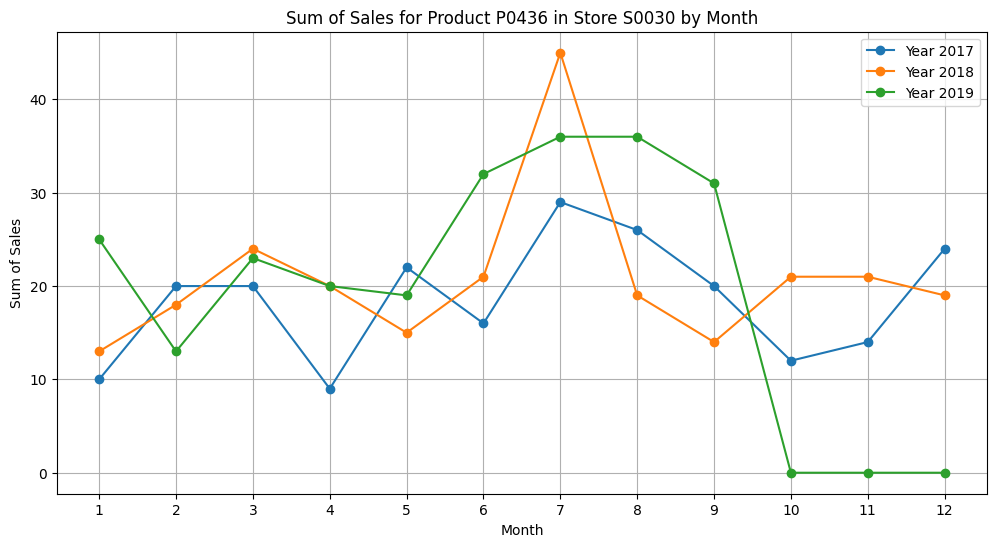

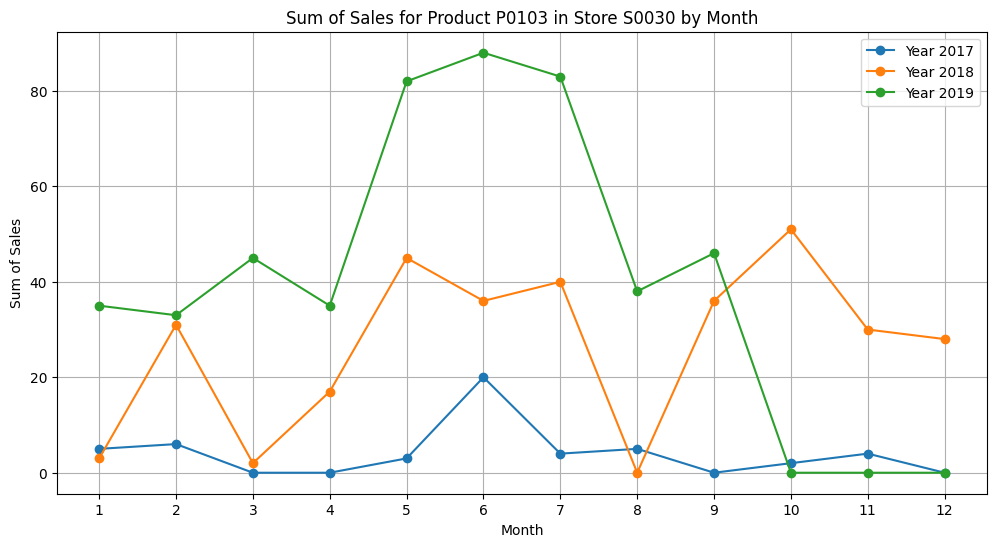

In [ ]:
# Convert 'date' column to datetime format
konya['date'] = pd.to_datetime(konya['date'])

# Filter the DataFrame for store 'S0030'
store_S0030 = konya[konya['store_id'] == 'S0030']

# Filter the DataFrame for the specific products
products_S0030 = store_S0030[store_S0030['product_id'].isin(['P0569','P0436', 'P0103'])]

# Extract year and month from the date
products_S0030['year'] = products_S0030['date'].dt.year
products_S0030['month'] = products_S0030['date'].dt.month

# Group by year, month, and product_id, then sum the sales
sales_sum = products_S0030.groupby(['year', 'month', 'product_id'])['sales'].sum().reset_index()

# Plotting each product separately
products = ['P0569', 'P0436', 'P0103']

for product in products:
    plt.figure(figsize=(12, 6))

    for year in [2017, 2018, 2019]:
        product_sales = sales_sum[(sales_sum['product_id'] == product) & (sales_sum['year'] == year)]

        # Create a pivot table to ensure all months are represented
        pivot = product_sales.pivot(index='month', columns='year', values='sales').reindex(range(1, 13)).fillna(0)

        plt.plot(pivot.index, pivot[year], marker='o', label=f'Year {year}')

    plt.title(f'Sum of Sales for Product {product} in Store S0030 by Month')
    plt.xlabel('Month')
    plt.ylabel('Sum of Sales')
    plt.xticks(range(1, 13))  # Ensure months 1-12 are shown on the x-axis
    plt.legend()
    plt.grid(True)
    plt.show()

####S0094

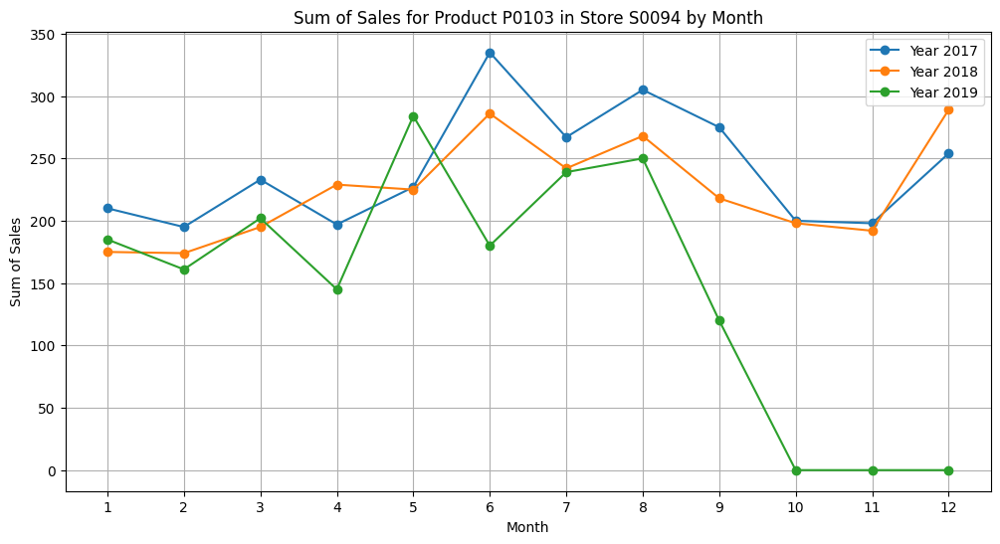

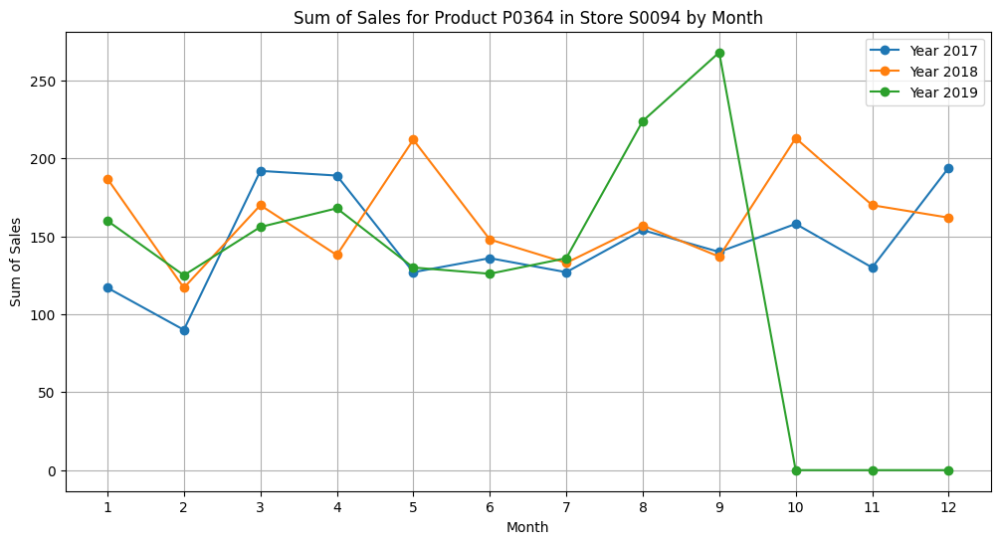

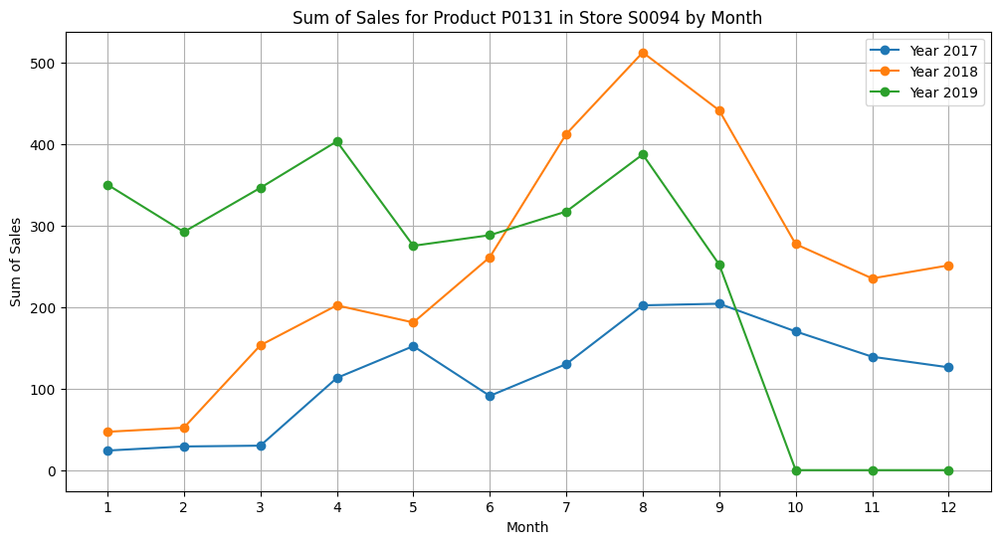

In [ ]:
# Convert 'date' column to datetime format
konya['date'] = pd.to_datetime(konya['date'])

# Filter the DataFrame for store 'S0030'
store_S0094 = konya[konya['store_id'] == 'S0094']

# Filter the DataFrame for the specific products
products_S0094 = store_S0094[store_S0094['product_id'].isin(['P0103','P0364', 'P0131'])]

# Extract year and month from the date
products_S0094['year'] = products_S0094['date'].dt.year
products_S0094['month'] = products_S0094['date'].dt.month

# Group by year, month, and product_id, then sum the sales
sales_sum = products_S0094.groupby(['year', 'month', 'product_id'])['sales'].sum().reset_index()

# Plotting each product separately
products = ['P0103','P0364', 'P0131']

for product in products:
    plt.figure(figsize=(12, 6))

    for year in [2017, 2018, 2019]:
        product_sales = sales_sum[(sales_sum['product_id'] == product) & (sales_sum['year'] == year)]

        # Create a pivot table to ensure all months are represented
        pivot = product_sales.pivot(index='month', columns='year', values='sales').reindex(range(1, 13)).fillna(0)

        plt.plot(pivot.index, pivot[year], marker='o', label=f'Year {year}')

    plt.title(f'Sum of Sales for Product {product} in Store S0094 by Month')
    plt.xlabel('Month')
    plt.ylabel('Sum of Sales')
    plt.xticks(range(1, 13))  # Ensure months 1-12 are shown on the x-axis
    plt.legend()
    plt.grid(True)
    plt.show()

####S0142

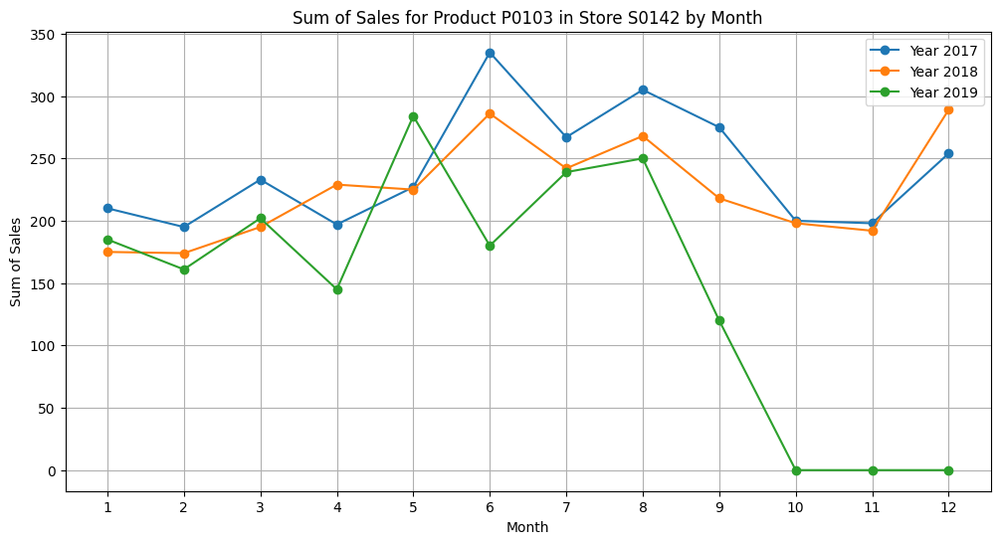

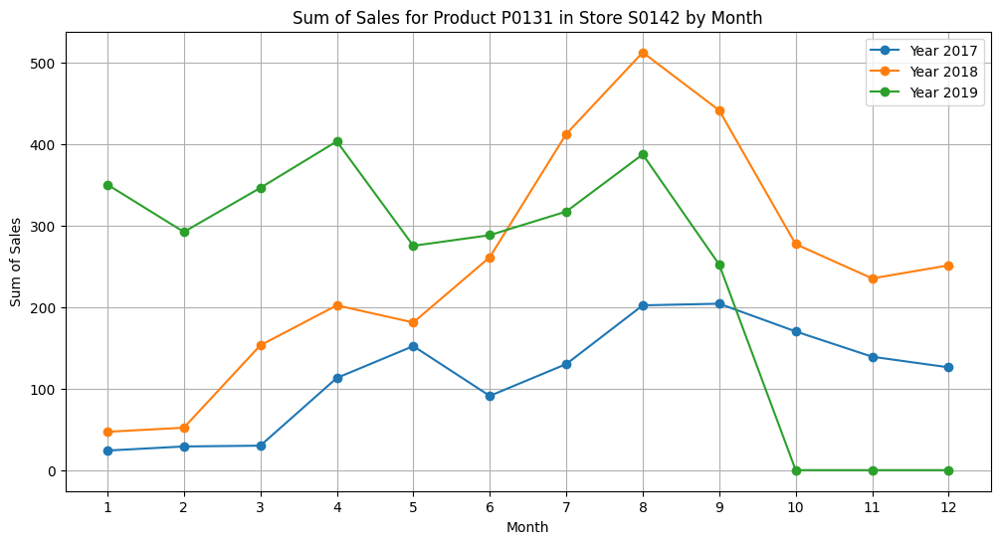

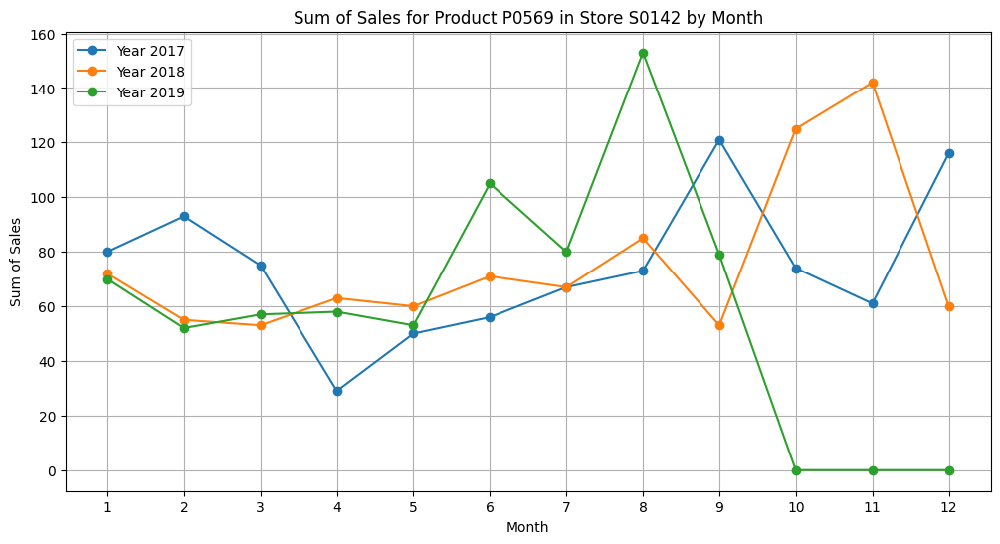

In [ ]:
# Convert 'date' column to datetime format
konya['date'] = pd.to_datetime(konya['date'])

# Filter the DataFrame for store 'S0030'
store_S0142 = konya[konya['store_id'] == 'S0094']

# Filter the DataFrame for the specific products
products_S0142 = store_S0142[store_S0142['product_id'].isin(['P0103','P0131', 'P0569'])]

# Extract year and month from the date
products_S0142['year'] = products_S0142['date'].dt.year
products_S0142['month'] = products_S0142['date'].dt.month

# Group by year, month, and product_id, then sum the sales
sales_sum = products_S0142.groupby(['year', 'month', 'product_id'])['sales'].sum().reset_index()

# Plotting each product separately
products = ['P0103','P0131', 'P0569']

for product in products:
    plt.figure(figsize=(12, 6))

    for year in [2017, 2018, 2019]:
        product_sales = sales_sum[(sales_sum['product_id'] == product) & (sales_sum['year'] == year)]

        # Create a pivot table to ensure all months are represented
        pivot = product_sales.pivot(index='month', columns='year', values='sales').reindex(range(1, 13)).fillna(0)

        plt.plot(pivot.index, pivot[year], marker='o', label=f'Year {year}')

    plt.title(f'Sum of Sales for Product {product} in Store S0142 by Month')
    plt.xlabel('Month')
    plt.ylabel('Sum of Sales')
    plt.xticks(range(1, 13))  # Ensure months 1-12 are shown on the x-axis
    plt.legend()
    plt.grid(True)
    plt.show()

##Sales by product and store


####Check how many products each store has

In [ ]:
# Count the number of unique products in each store
product_counts_per_store = konya.groupby('store_id')['product_id'].nunique().reset_index()

# Rename the columns for clarity
product_counts_per_store.columns = ['store', 'product_count']

# Display the number of products in each cluster
print(product_counts_per_store)

  storer  product_count
0  S0030            122
1  S0094            470
2  S0142            352


###Check if there is any product that is present in more than one store


In [ ]:
# Group by product_id and count unique store_ids
product_stores = konya.groupby('product_id')['store_id'].nunique().reset_index()

# Filter products that are in more than one store_id
products_in_multiple_stores = product_stores[product_stores['store_id'] > 1]['product_id']

# Display products that are in more than one store_id and the corresponding stores
print("Products present in more than one store with the corresponding stores:")
for product in products_in_multiple_stores:
    stores = konya[konya['product_id'] == product]['store_id'].unique()
    print(f"Product ID: {product}, Stores: {', '.join(map(str, stores))}")

all_stores = konya['store_id'].unique()
total_stores = len(all_stores)

# Filter products that are present in all unique stores
products_in_all_stores = product_stores[product_stores['store_id'] == total_stores]['product_id']

# Count the number of products that are present in all stores
num_products_in_all_stores = len(products_in_all_stores)

# Display the result
print(f"Number of products that are present in all {total_stores} stores: {num_products_in_all_stores}")

# If you also want to list the products
print("Products present in all stores:")
for product in products_in_all_stores:
    print(f"Product ID: {product}")

Products present in more than one store with the corresponding stores:
Product ID: P0001, Stores: S0094, S0142
Product ID: P0005, Stores: S0094, S0142
Product ID: P0007, Stores: S0094, S0142
Product ID: P0009, Stores: S0094, S0142
Product ID: P0012, Stores: S0094, S0142
Product ID: P0015, Stores: S0030, S0094, S0142
Product ID: P0017, Stores: S0094, S0142
Product ID: P0018, Stores: S0030, S0094, S0142
Product ID: P0024, Stores: S0094, S0142
Product ID: P0025, Stores: S0094, S0142
Product ID: P0026, Stores: S0030, S0094, S0142
Product ID: P0028, Stores: S0094, S0142
Product ID: P0033, Stores: S0094, S0142
Product ID: P0035, Stores: S0030, S0094, S0142
Product ID: P0039, Stores: S0030, S0094, S0142
Product ID: P0042, Stores: S0094, S0142
Product ID: P0044, Stores: S0030, S0094, S0142
Product ID: P0045, Stores: S0094, S0142
Product ID: P0046, Stores: S0094, S0142
Product ID: P0047, Stores: S0094, S0142
Product ID: P0051, Stores: S0030, S0094, S0142
Product ID: P0054, Stores: S0094, S0142


##Sales by cluster

####Check how many products each cluster has

---



In [ ]:
# Count the number of unique products in each cluster
product_counts_per_cluster = konya.groupby('cluster_id')['product_id'].nunique().reset_index()

# Rename the columns for clarity
product_counts_per_cluster.columns = ['cluster', 'product_count']

# Display the number of products in each cluster
print(product_counts_per_cluster)




     cluster  product_count
0  cluster_0            300
1  cluster_1              4
2  cluster_2              9
3  cluster_3             28
4  cluster_4             34
5  cluster_5             12
6  cluster_6             23
7  cluster_7             10
8  cluster_8             14
9  cluster_9             46


####Check how many hierarchy1_id each cluster has



In [ ]:
# Count the number of unique products in each cluster
h_counts_per_cluster = konya.groupby('cluster_id')['hierarchy1_id'].nunique().reset_index()

# Rename the columns for clarity
h_counts_per_cluster.columns = ['cluster', 'hierarchy1_count']

# Display the number of products in each cluster
print(h_counts_per_cluster)

     cluster  hierarchy1_count
0  cluster_0                 4
1  cluster_1                 1
2  cluster_2                 3
3  cluster_3                 3
4  cluster_4                 3
5  cluster_5                 3
6  cluster_6                 3
7  cluster_7                 4
8  cluster_8                 3
9  cluster_9                 4


####Check how many store_id each cluster has

In [ ]:
# Count the number of unique products in each cluster
store_counts_per_cluster = konya.groupby('cluster_id')['store_id'].nunique().reset_index()

# Rename the columns for clarity
store_counts_per_cluster.columns = ['cluster', 'store_count']

# Display the number of products in each cluster
print(store_counts_per_cluster)

     cluster  store_count
0  cluster_0            3
1  cluster_1            3
2  cluster_2            3
3  cluster_3            3
4  cluster_4            3
5  cluster_5            3
6  cluster_6            3
7  cluster_7            3
8  cluster_8            3
9  cluster_9            3


###Check if there is any product that is present in more than one cluster

In [ ]:
# Group by product_id and count unique clusters
product_clusters = konya.groupby('product_id')['cluster_id'].nunique().reset_index()

# Filter products that are in more than one cluster
products_in_multiple_clusters = product_clusters[product_clusters['cluster_id'] > 1]

# Display products that are in more than one cluster
print("Products present in more than one cluster:")
print(products_in_multiple_clusters)

Products present in more than one cluster:
Empty DataFrame
Columns: [product_id, cluster_id]
Index: []


###Check if the dimensions of the products are similiar within cluster

In [ ]:
# Remove duplicate entries by keeping the first occurrence
konya_unique = konya.drop_duplicates(subset=['cluster_id', 'product_id'])

# Optionally, aggregate if needed (e.g., average width if duplicates exist)
# df_unique = df.groupby(['cluster', 'product_id']).agg({'product_width': 'mean'}).reset_index()

# Display the cleaned dataset
print(konya_unique.head(10))

# Get unique clusters
clusters = konya_unique['cluster_id'].unique()



  store_id product_id       date  sales  revenue  stock  price promo_type_1  \
0    S0030      P0015 2017-01-02    0.0     0.00    4.0   2.60         PR14   
1    S0030      P0018 2017-01-02    1.0     1.81    5.0   1.95         PR14   
2    S0030      P0035 2017-01-02    2.0     4.54    1.0   2.45         PR14   
3    S0030      P0051 2017-01-02    0.0     0.00   27.0   0.70         PR14   
4    S0030      P0055 2017-01-02    0.0     0.00   12.0   3.50         PR05   
5    S0030      P0057 2017-01-02    0.0     0.00    4.0  12.90         PR14   
6    S0030      P0062 2017-01-02    0.0     0.00    5.0  19.90         PR14   
7    S0030      P0099 2017-01-02    0.0     0.00    5.0  10.90         PR14   
8    S0030      P0103 2017-01-02    0.0     0.00   13.0   2.65         PR14   
9    S0030      P0114 2017-01-02    1.0     0.42   20.0   0.45         PR14   

  promo_bin_1 promo_type_2  ... city_id_old  country_id city_code  weekday  \
0         NaN         PR03  ...        C006      Tur

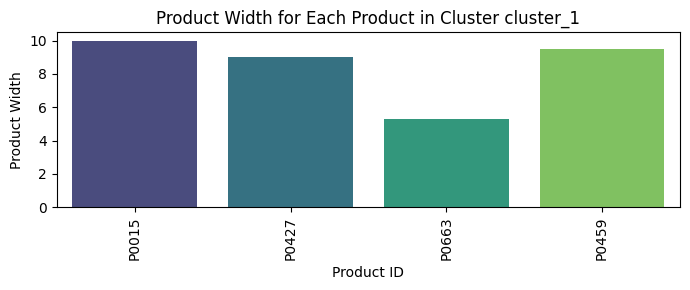

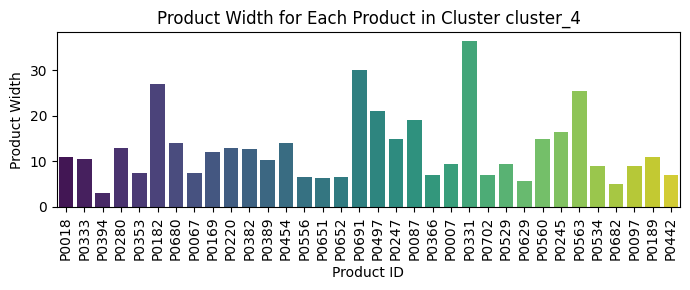

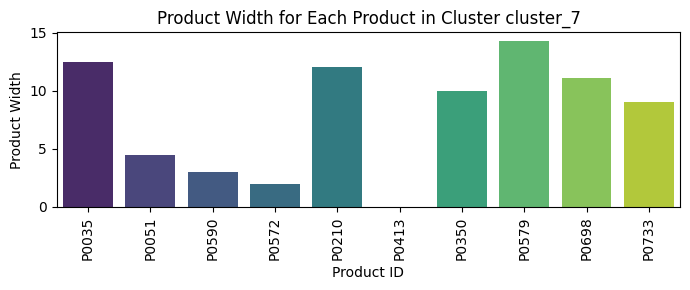

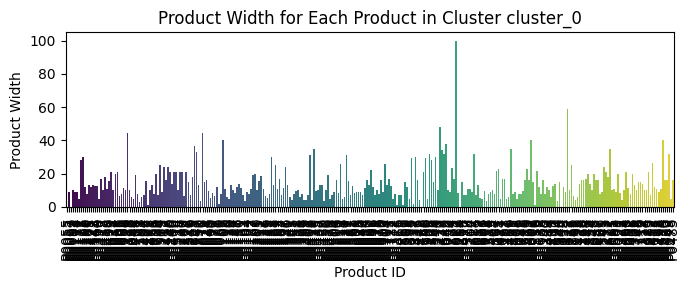

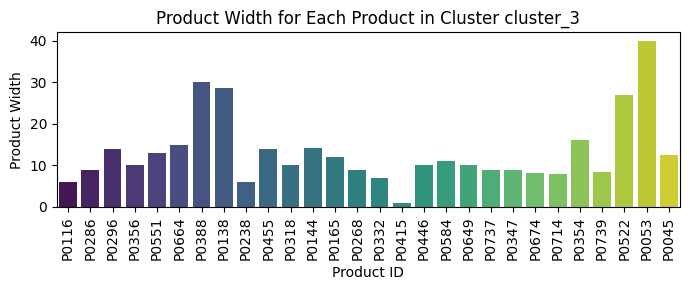

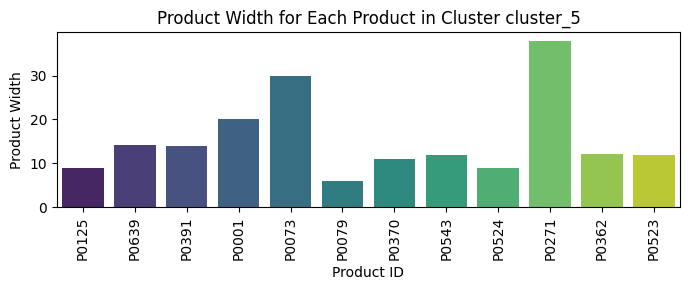

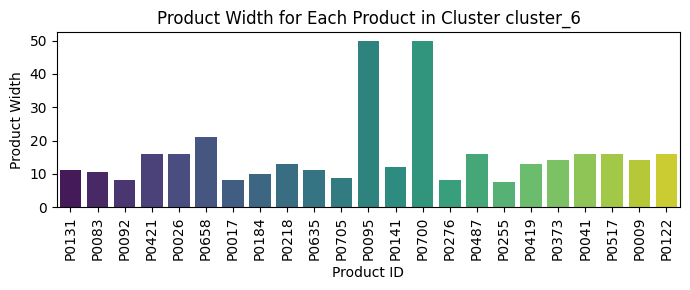

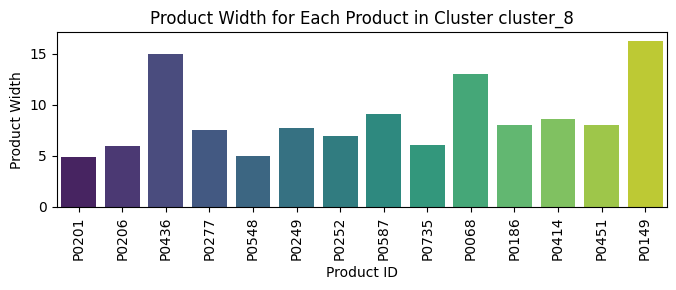

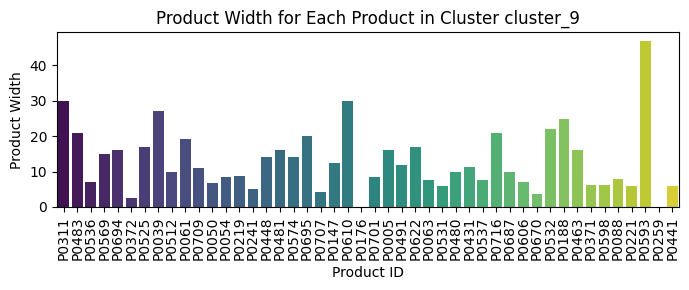

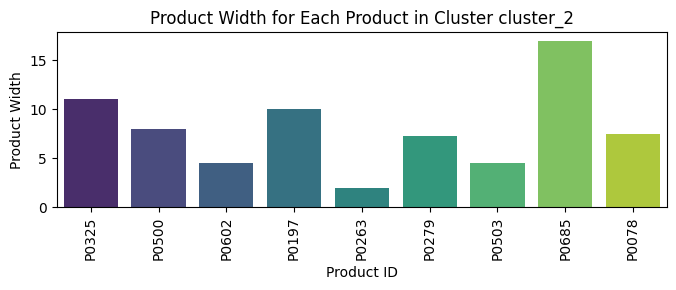

In [ ]:
# Plot product_width for each cluster
for cluster in clusters:
    # Filter data for the current cluster
    cluster_data = konya_unique[konya_unique['cluster_id'] == cluster]

    # Create a bar plot
    plt.figure(figsize=(7, 3))
    sns.barplot(x='product_id', y='product_width', data=cluster_data, palette='viridis')

    # Customize the plot
    plt.xticks(rotation=90)  # Rotate x labels for better readability
    plt.title(f'Product Width for Each Product in Cluster {cluster}')
    plt.xlabel('Product ID')
    plt.ylabel('Product Width')
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

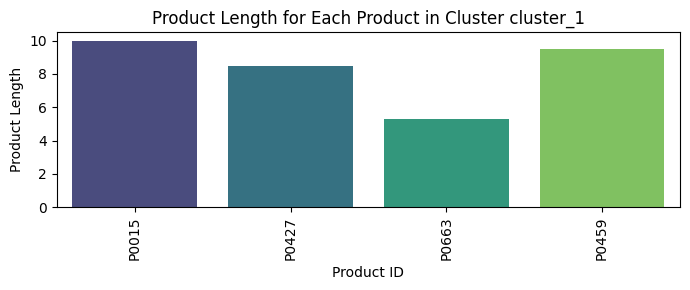

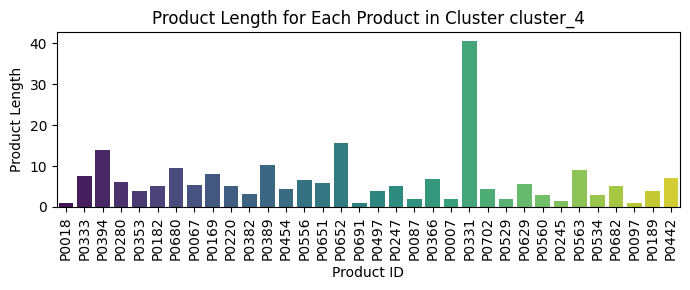

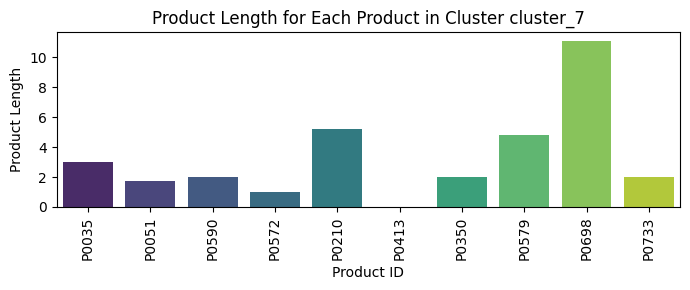

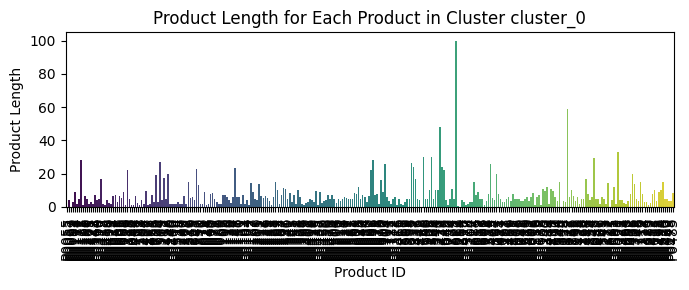

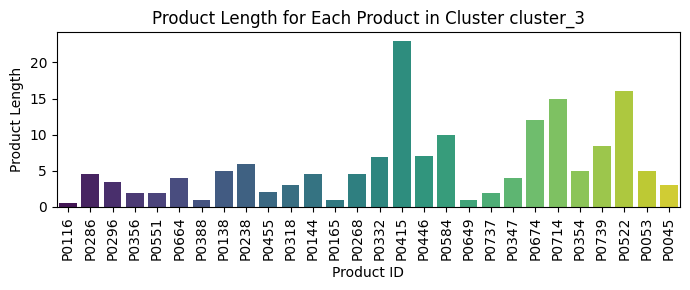

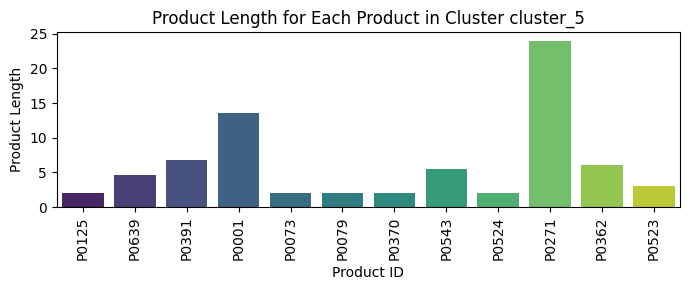

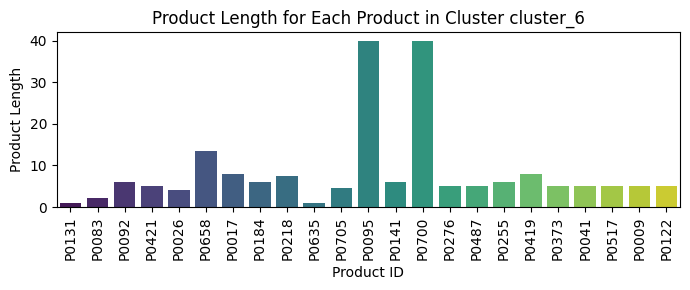

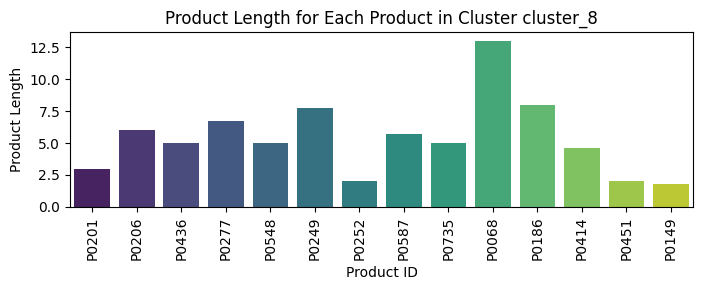

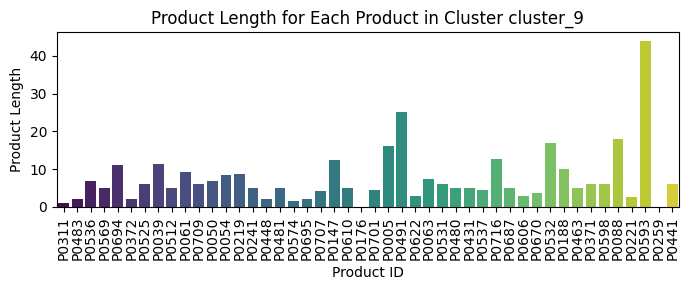

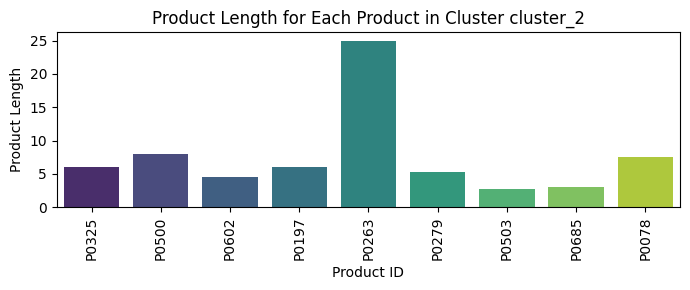

In [ ]:
# Plot product_width for each cluster
for cluster in clusters:
    # Filter data for the current cluster
    cluster_data = konya_unique[konya_unique['cluster_id'] == cluster]

    # Create a bar plot
    plt.figure(figsize=(7, 3))
    sns.barplot(x='product_id', y='product_length', data=cluster_data, palette='viridis')

    # Customize the plot
    plt.xticks(rotation=90)  # Rotate x labels for better readability
    plt.title(f'Product Length for Each Product in Cluster {cluster}')
    plt.xlabel('Product ID')
    plt.ylabel('Product Length')
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

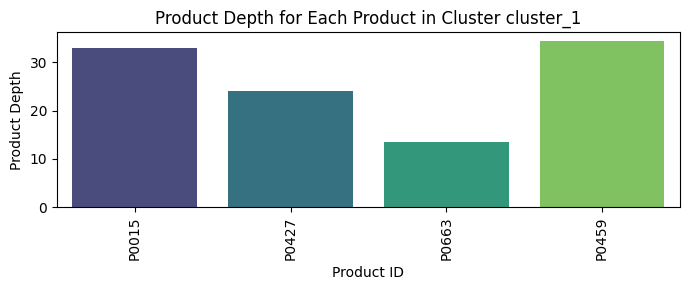

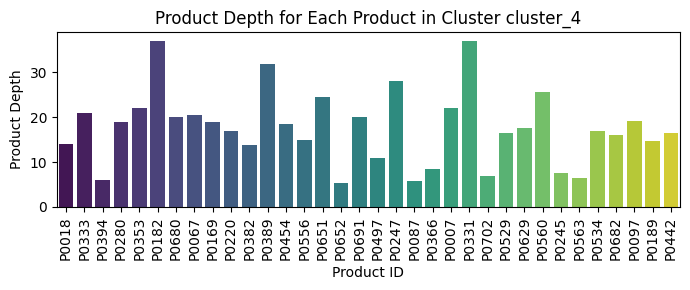

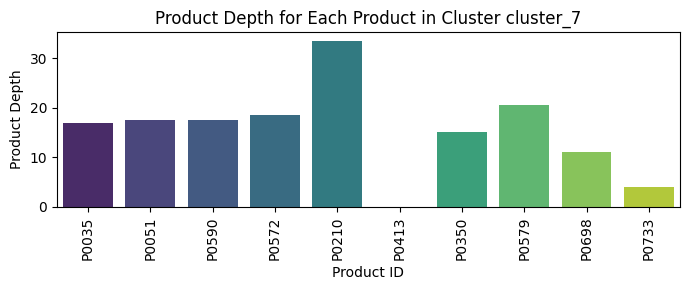

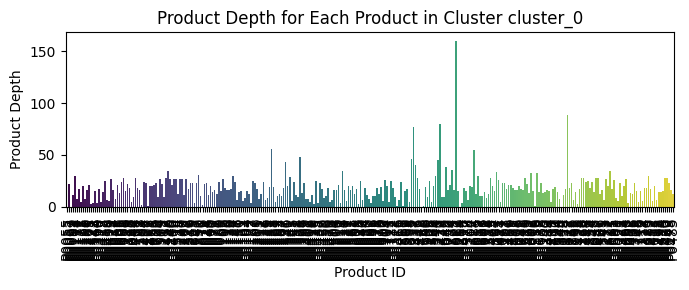

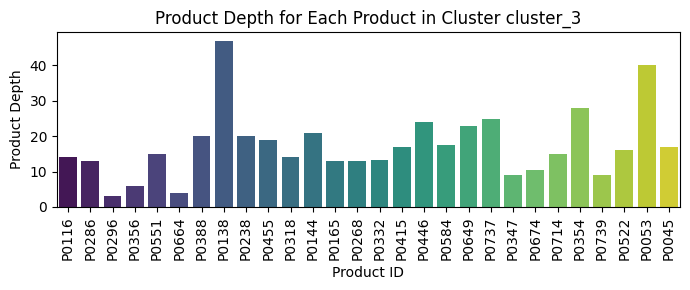

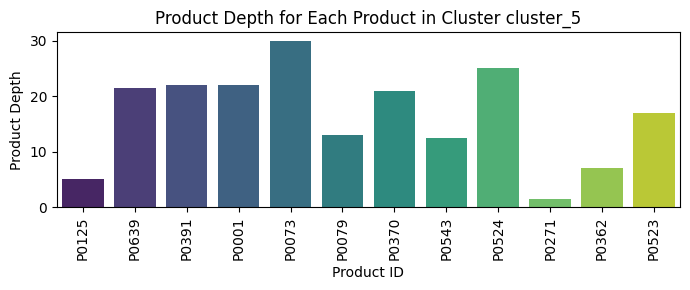

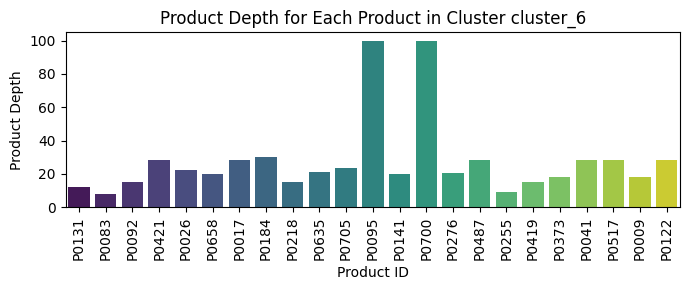

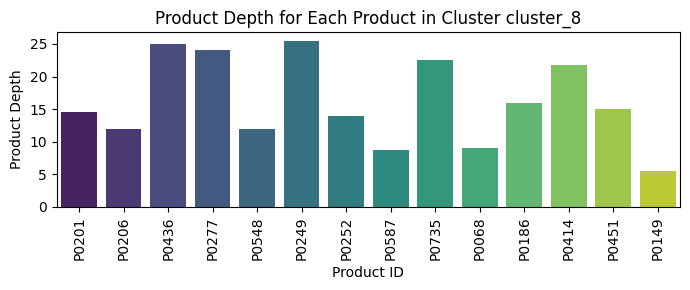

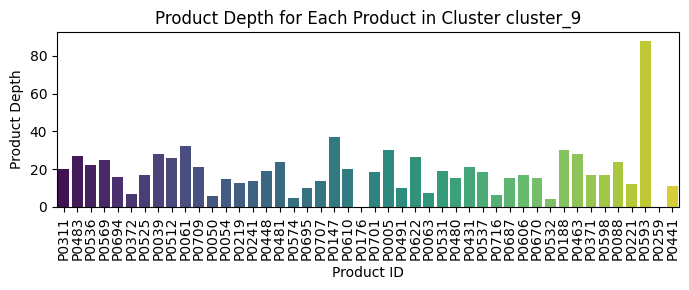

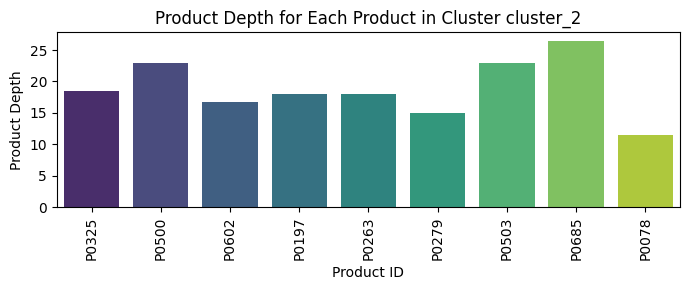

In [ ]:
# Plot product_width for each cluster
for cluster in clusters:
    # Filter data for the current cluster
    cluster_data = konya_unique[konya_unique['cluster_id'] == cluster]

    # Create a bar plot
    plt.figure(figsize=(7, 3))
    sns.barplot(x='product_id', y='product_depth', data=cluster_data, palette='viridis')

    # Customize the plot
    plt.xticks(rotation=90)  # Rotate x labels for better readability
    plt.title(f'Product Depth for Each Product in Cluster {cluster}')
    plt.xlabel('Product ID')
    plt.ylabel('Product Depth')
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

###Time evolution

####Check product sales evolution for each cluster

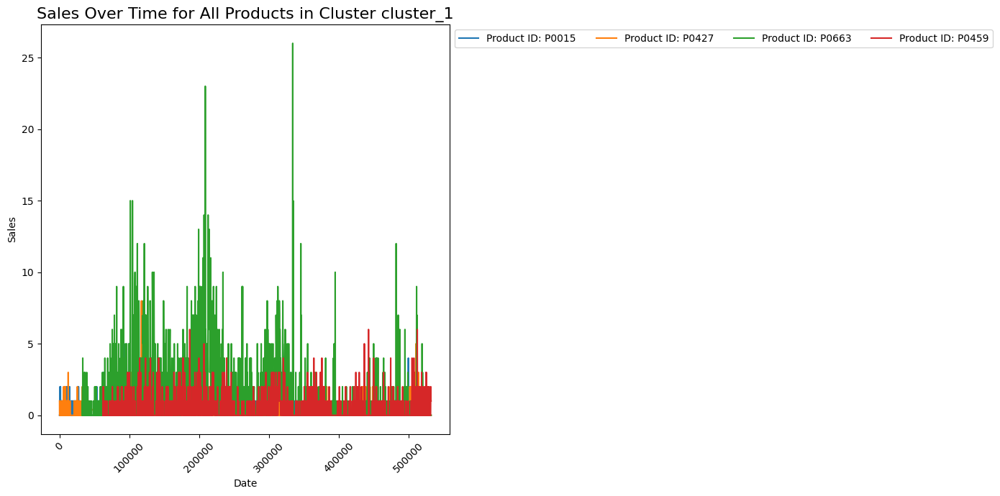

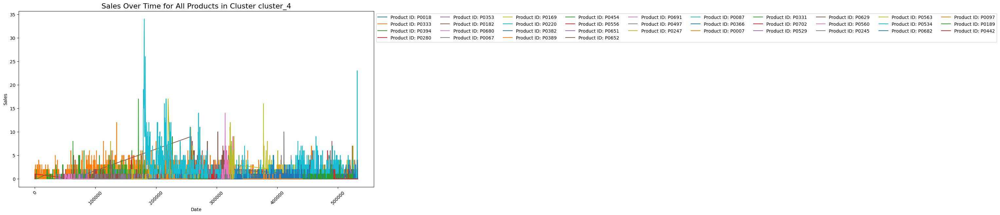

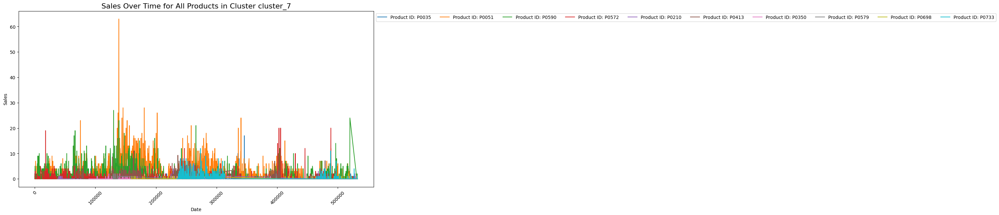

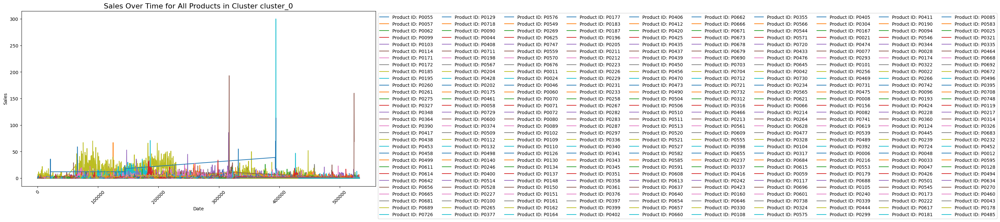

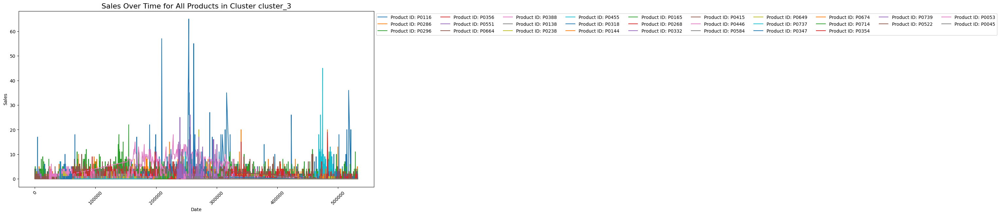

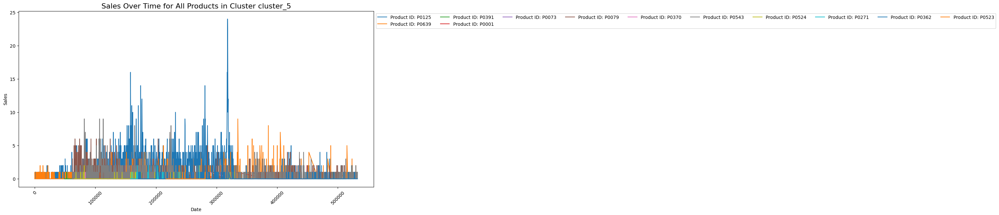

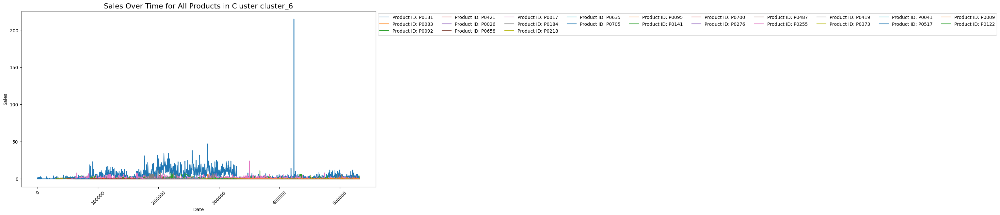

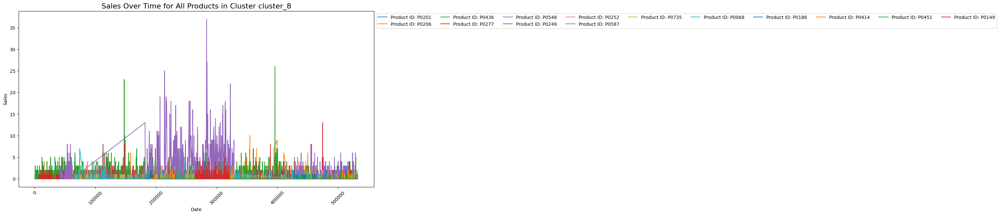

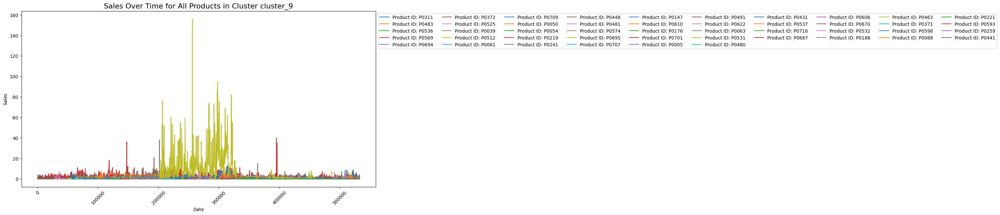

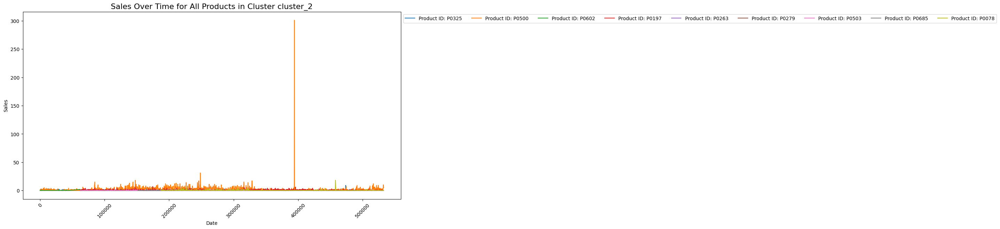

In [ ]:
# Ensure the date column is in datetime format
#konya['date'] = pd.to_datetime(konya['date'])

# Set the date column as the index
#konya.set_index('date', inplace=True)

# Get unique clusters
clusters = konya['cluster_id'].unique()

# Iterate through each cluster
for cluster_id in clusters:
    # Filter the dataset for the given cluster
    cluster_data = konya[konya['cluster_id'] == cluster_id]

    # Get the list of unique products within the cluster
    products = cluster_data['product_id'].unique()

    # Create a figure for the current cluster
    plt.figure(figsize=(14, 7))
    plt.title(f'Sales Over Time for All Products in Cluster {cluster_id}', fontsize=16)

    # Plot sales for each product
    for product in products:
        product_data = cluster_data[cluster_data['product_id'] == product]
        plt.plot(product_data.index, product_data['sales'], label=f'Product ID: {product}')

    # Customize the plot
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=10)  # Move legend outside the plot and use 2 columns
    plt.xticks(rotation=45)  # Rotate x labels for better readability
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

####Check product stock evolution for each cluster

In [ ]:
# Iterate through each cluster
for cluster_id in clusters:
    # Filter the dataset for the given cluster
    cluster_data = df1[df1['cluster_id'] == cluster_id]

    # Get the list of unique products within the cluster
    products = cluster_data['product_id'].unique()

    # Create a figure for the current cluster
    plt.figure(figsize=(14, 7))
    plt.title(f'Stock Over Time for All Products in Cluster {cluster_id}', fontsize=16)

    # Plot sales for each product
    for product in products:
        product_data = cluster_data[cluster_data['product_id'] == product]
        plt.plot(product_data.index, product_data['stock'], label=f'Product ID: {product}')

    # Customize the plot
    plt.xlabel('Date')
    plt.ylabel('Stock')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=10)  # Move legend outside the plot and use 2 columns
    plt.xticks(rotation=45)  # Rotate x labels for better readability
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

####Check product price evolution for each cluster

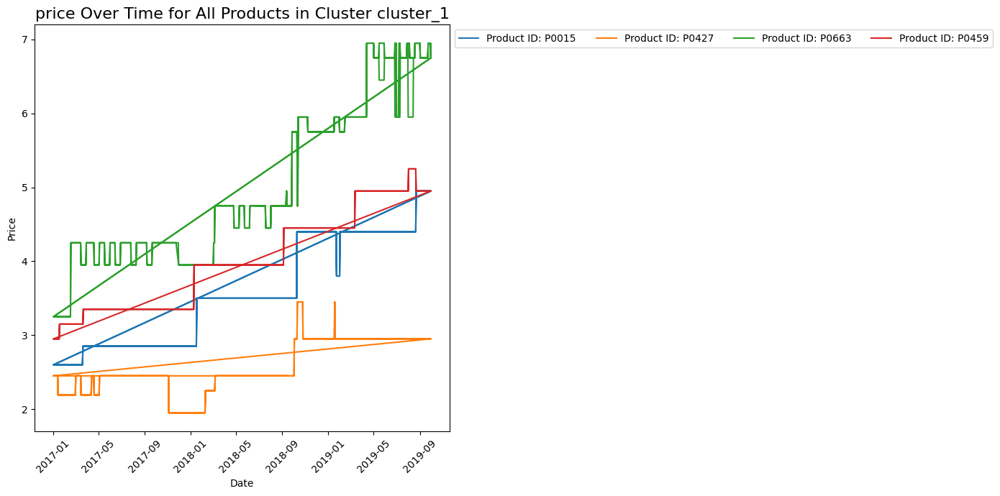

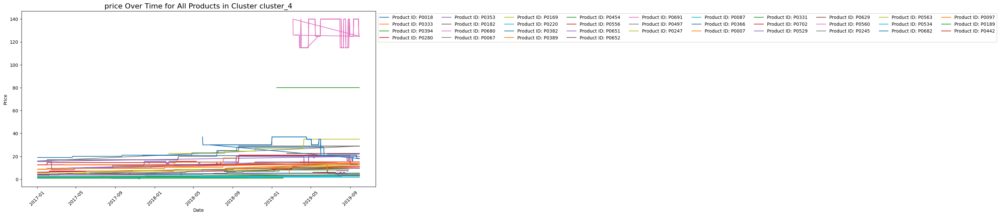

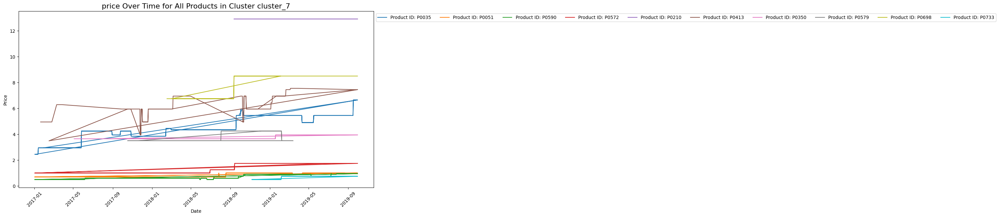

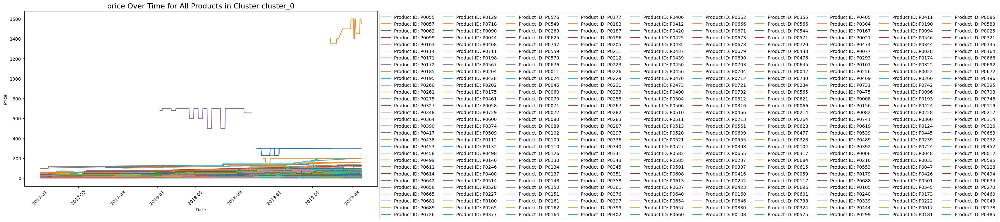

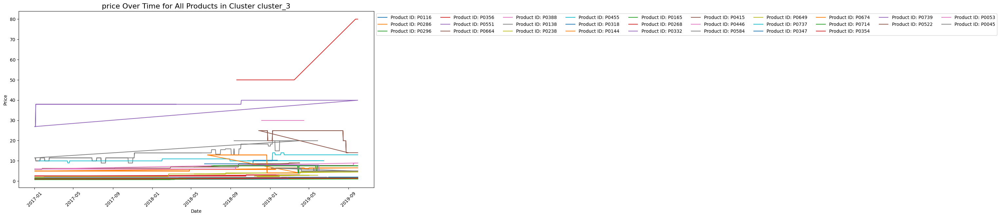

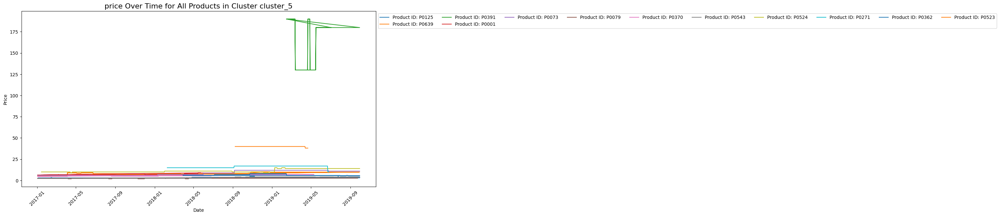

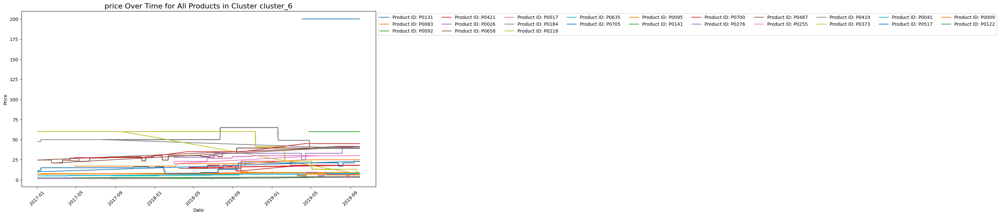

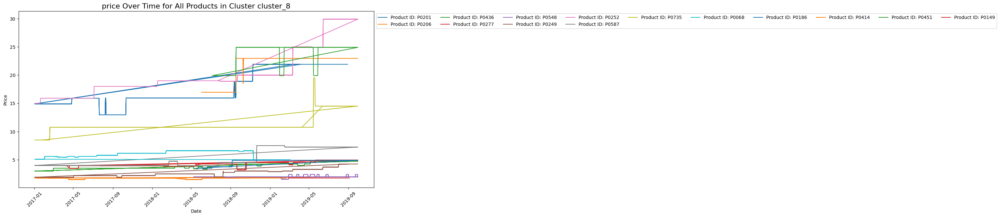

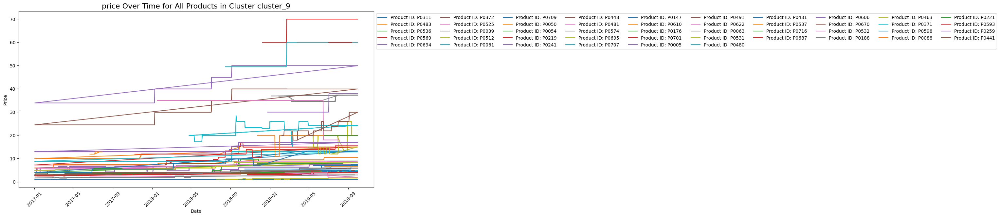

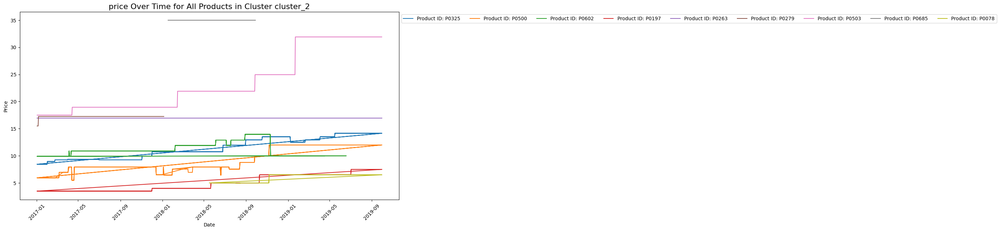

In [ ]:
# Iterate through each cluster
for cluster_id in clusters:
    # Filter the dataset for the given cluster
    cluster_data = df1[df1['cluster_id'] == cluster_id]

    # Get the list of unique products within the cluster
    products = cluster_data['product_id'].unique()

    # Create a figure for the current cluster
    plt.figure(figsize=(14, 7))
    plt.title(f'price Over Time for All Products in Cluster {cluster_id}', fontsize=16)

    # Plot sales for each product
    for product in products:
        product_data = cluster_data[cluster_data['product_id'] == product]
        plt.plot(product_data.index, product_data['price'], label=f'Product ID: {product}')

    # Customize the plot
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=10)  # Move legend outside the plot and use 2 columns
    plt.xticks(rotation=45)  # Rotate x labels for better readability
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()

####Check product revenue evolution for each cluster

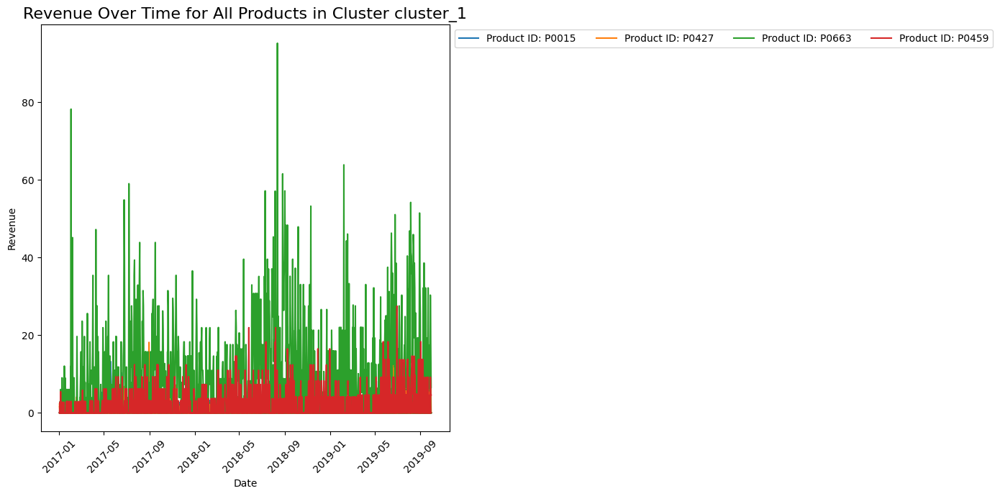

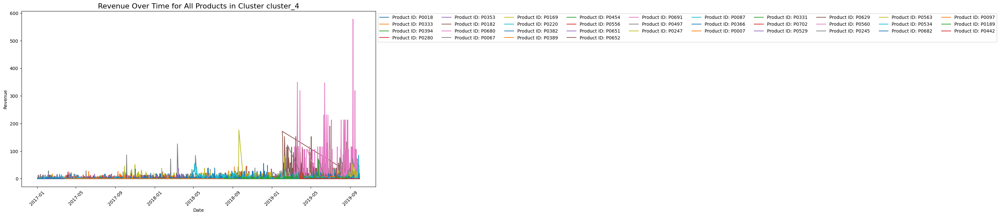

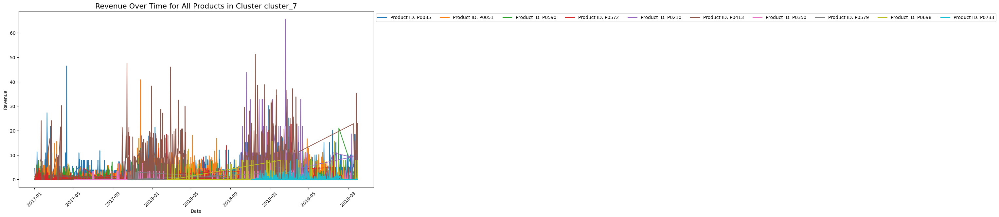

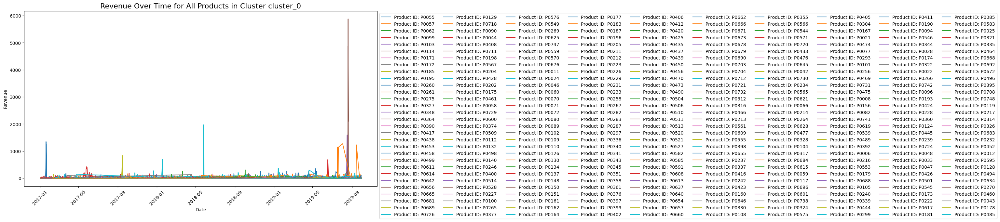

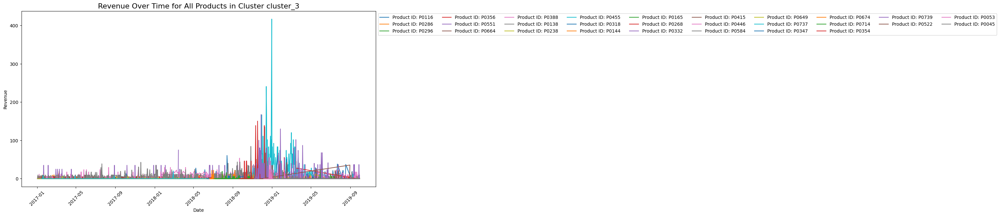

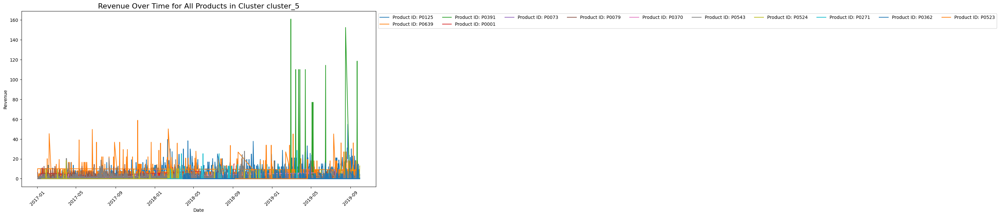

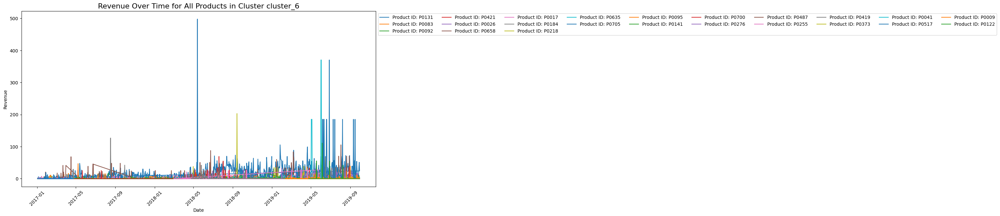

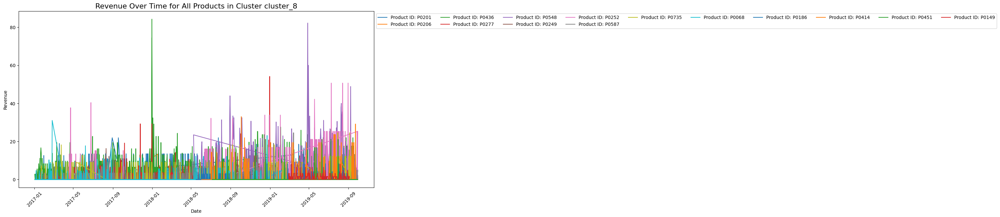

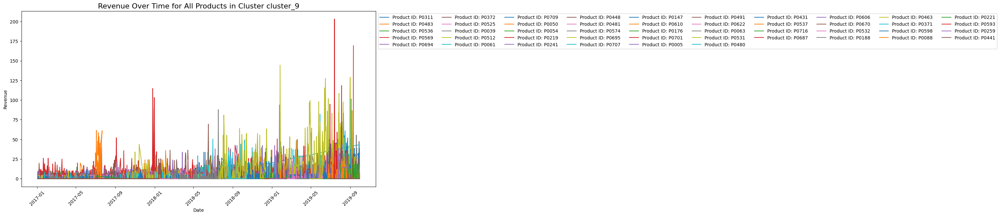

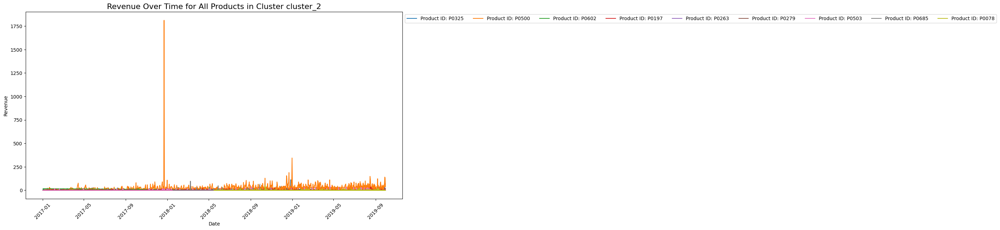

In [ ]:
# Iterate through each cluster
for cluster_id in clusters:
    # Filter the dataset for the given cluster
    cluster_data = df1[df1['cluster_id'] == cluster_id]

    # Get the list of unique products within the cluster
    products = cluster_data['product_id'].unique()

    # Create a figure for the current cluster
    plt.figure(figsize=(14, 7))
    plt.title(f'Revenue Over Time for All Products in Cluster {cluster_id}', fontsize=16)

    # Plot sales for each product
    for product in products:
        product_data = cluster_data[cluster_data['product_id'] == product]
        plt.plot(product_data.index, product_data['revenue'], label=f'Product ID: {product}')

    # Customize the plot
    plt.xlabel('Date')
    plt.ylabel('Revenue')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=10)  # Move legend outside the plot and use 2 columns
    plt.xticks(rotation=45)  # Rotate x labels for better readability
    plt.tight_layout()  # Adjust layout to fit labels

    # Show the plot
    plt.show()